In [1]:
import numpy as np
import scipy.sparse.linalg
import matplotlib.pyplot as plt
from utils import *
from plot import *
from sympy import symbols
import matplotlib.tri as tri
from scipy.linalg import eigh

/Users/romain/miniconda3/envs/MNSS/lib/python3.11/site-packages/scipy/__init__.py:155: UserWarning: A NumPy version >=1.18.5 and <1.26.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


# avertissement #

Le code prend beaucoup de temps pour run entièrement (environ 5h sur nos ordi). Nous recommendons donc de simplement le vérifier ainsi que les output sans run de nouveau ou de largement réaugmenter lc (pas nécessaire pour T3 mais pour T6)

# Avec T3

### Depuis le notebook test T3 :

Info    : Reading 'disque_T3_lc_20.geo'...
Info    : Done reading 'disque_T3_lc_20.geo'
Info    : Meshing 1D...
Info    : [  0%] Meshing curve 1 (Circle)
Info    : [ 30%] Meshing curve 2 (Circle)
Info    : [ 60%] Meshing curve 3 (Circle)
Info    : [ 80%] Meshing curve 4 (Circle)
Info    : Done meshing 1D (Wall 0.000223375s, CPU 0.000163s)
Info    : Meshing 2D...
Info    : Meshing surface 6 (Plane, Frontal-Delaunay)
Info    : Done meshing 2D (Wall 0.000998667s, CPU 0.00063s)
Info    : 42 nodes 85 elements
Info    : Writing 'disque_T3_lc_20.msh'...
Info    : Done writing 'disque_T3_lc_20.msh'
Info    : Running '/Users/romain/miniconda3/envs/MNSS/bin/gmsh -2 -order 1 -o tmp.msh disque_T3_lc_20.msh' [Gmsh 4.15.2, 1 node, max. 1 thread]
Info    : Started on Tue Apr 21 15:53:27 2026
Info    : Reading 'disque_T3_lc_20.msh'...
Info    : 10 entities
Info    : 41 nodes
Info    : 72 elements
Info    : Done reading 'disque_T3_lc_20.msh'
Info    : Meshing 1D...
Info    : Done meshing 1D (Wall 1.483

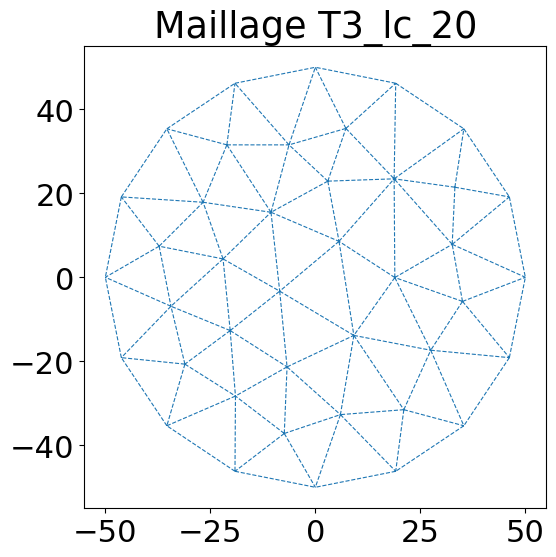

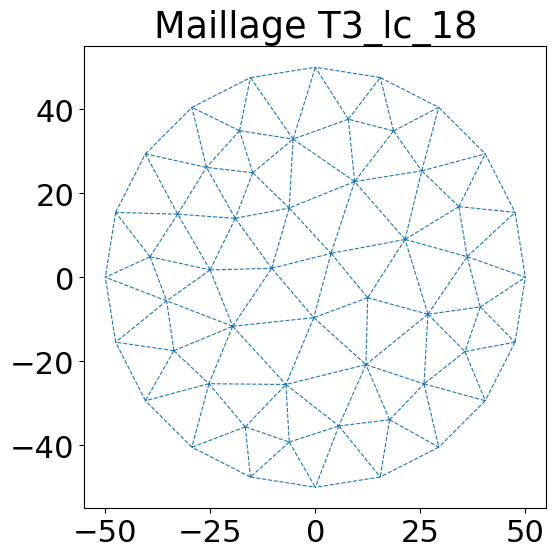

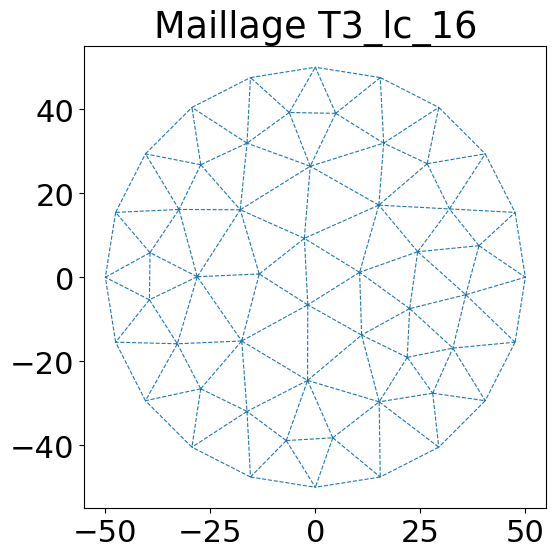

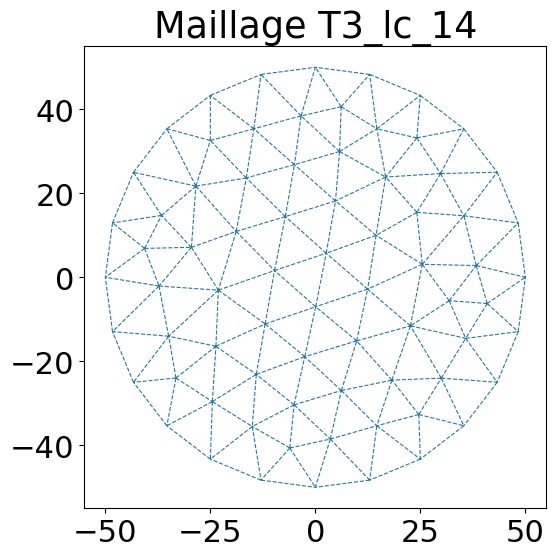

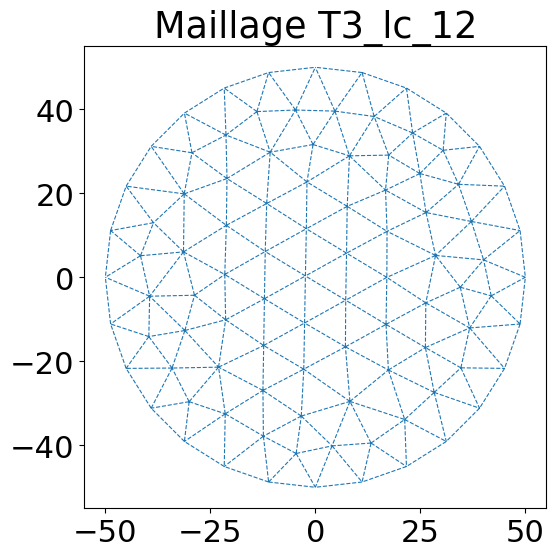

In [2]:
import gmsh

def generer_geo_disque(r=50.0, lc=5.0, nom_geo="disque.geo", nom_msh="disque.msh"):
    contenu_geo = f"""
lc = {lc};
r = {r};
xc = 0.0;
yc = 0.0;

Point(1) = {{xc + r, yc, 0, lc}};
Point(2) = {{xc, yc + r, 0, lc}};
Point(3) = {{xc - r, yc, 0, lc}};
Point(4) = {{xc, yc - r, 0, lc}};
Point(5) = {{xc, yc, 0, lc}};

Circle(1) = {{1, 5, 2}};
Circle(2) = {{2, 5, 3}};
Circle(3) = {{3, 5, 4}};
Circle(4) = {{4, 5, 1}};

Line Loop(5) = {{1, 2, 3, 4}};
Plane Surface(6) = {{5}};
Physical Surface(7) = {{6}};
Physical Line(8) = {{2}}; // demi-cercle supérieur
Physical Line(9) = {{4}}; // demi-cercle inférieur

Mesh.SecondOrderIncomplete = 1;
"""
    with open(nom_geo, 'w') as f:
        f.write(contenu_geo)

    # Génération du .msh directement après le .geo
    gmsh.initialize()
    gmsh.open(nom_geo)
    gmsh.model.mesh.generate(2)
    gmsh.write(nom_msh)
    gmsh.finalize()

    return nom_geo, nom_msh


# ------------------------
# Génération des maillages
# ------------------------

lc_values = np.arange(20, 10, -2)
r = 50.0

nodes_T3_dict = {}
conn_T3_dict = {}

for order in [1]:  # 1 = T3, 2 = T6
    for lc in lc_values:
        suffix = f"T{order*3}_lc_{str(lc).replace('.', '_')}"
        geo_file = f"disque_{suffix}.geo"
        msh_file = f"disque_{suffix}.msh"

        # Génére .geo et .msh
        generer_geo_disque(r=r, lc=lc, nom_geo=geo_file, nom_msh=msh_file)

        # Charge le maillage avec meshGeo (lecture .msh)
        coords, conn = meshGeo(msh_file, order=order)

        # Stocke les résultats
        nodes_T3_dict[suffix] = coords
        conn_T3_dict[suffix] = conn

        # Affiche
        plt.figure()
        plotMesh(coords, conn)
        plt.title(f"Maillage {suffix}")


In [3]:
nodes_T3_list = [nodes_T3_dict[f"T3_lc_{str(lc).replace('.', '_')}"] for lc in lc_values]
conn_T3_list = [conn_T3_dict[f"T3_lc_{str(lc).replace('.', '_')}"] for lc in lc_values]

In [4]:
def calculerD(contraintes_planes=True):
    
    E = 33600 # N/mm^2
    nu = 0.2    

    # On fait des contraintes planes par défaut
    if contraintes_planes:
        D = (E/(1-nu**2))* np.array(
            [[1,  nu, 0],
             [nu, 1,  0],
             [0,  0,  (1-nu)/2]])
    else:
        raise RuntimeError('Déformations planes à implémenter!')
    return D

N1 = lambda s, t: 1 - s - t
N2 = lambda s, t: s
N3 = lambda s, t: t

def calculerC():
    N1s, N1t = [-1, -1]
    N2s, N2t = [1, 0]
    N3s, N3t = [0, 1]
    C = np.array([
        [N1s, 0, N2s, 0, N3s, 0],
        [N1t, 0, N2t, 0, N3t, 0],
        [0, N1s, 0, N2s, 0, N3s],
        [0, N1t, 0, N2t, 0, N3t]])
    return C

def calculerBetJ(x, noeuds):
    C = calculerC()

    grads = C@noeuds.ravel()
    J = np.array([[grads[0], grads[2]],
                  [grads[1], grads[3]]])
    
    
    # Définition de A
    A = np.array([
        [1, 0, 0, 0],
        [0, 0, 0, 1],
        [0, 1, 1, 0]
    ])

    # Définition de la matrice contenant les Jacobiennes
    Jblock = np.zeros((4, 4))
    Jblock[:2, :2] = J
    Jblock[2:, 2:] = J
    
    Mat_J = np.linalg.inv(Jblock)
    B = A@Mat_J@C
    return B, J

def calculerMatriceRigiditeLocale(connectivite_element, coordonnees):
    
    quads = [[1/3, 1/3]]
    weights = [1/2]
    
    noeuds = coordonnees[connectivite_element.ravel(), :] # les noeuds de l'élément traité
    K_local = np.zeros((6, 6)) # 6x6 for T3 only
    
    for x_q, w_q in zip(quads, weights):
        B, J = calculerBetJ(x_q, noeuds)  # calcule B et J sur le point de quadrature x_q
        detJ = np.linalg.det(J)           # calcule det(J) pour l'intégration
        D = calculerD()                   # calcule la loi de constitution D
           
        # somme la quadrature avec le poid w_q
        K_local = K_local + w_q * B.T@D@B * detJ
        
    # l'épaisseur, on peut changer svv, j ai juste repris la valeur de la serie 
    t = 10. # mm
    
    return t*K_local

def calculerNumerosEquations(connectivite):

    n_elem  = connectivite.shape[0]
    n_nodes_per_elem = connectivite.shape[1]
    numEq = np.zeros((n_elem, 2*n_nodes_per_elem), dtype=int)
    for e in range(n_elem):
        for i in range(n_nodes_per_elem):
            numEq[e, 2*i]   = 2*connectivite[e, i];
            numEq[e, 2*i+1] = 2*connectivite[e, i]+1;
    return numEq

def assemblerMatriceRigidite(connectivite, coordonnees):

    n_elem  = connectivite.shape[0]
    n_nodes = coordonnees.shape[0]
    numEq = calculerNumerosEquations(connectivite)

    K = np.zeros((n_nodes*2, n_nodes*2))
    for e in range(n_elem):
        # On récupère les degrés de liberté de l'élément e
        ddl = numEq[e, :]
        # On récupère les noeuds de l'élément e
        connectivite_element = connectivite[e, :]
        # On calcule la matrice de rigidite locale de l'élément e
        K_locale = calculerMatriceRigiditeLocale(connectivite_element, coordonnees)
        # On assemble
        for i, gi in enumerate(ddl):
            for j, gj in enumerate(ddl):
                K[gi, gj] += K_locale[i, j]
    return K

In [5]:
def contraintes_principales(sigma):
    sxx, syy, txy = sigma
    moy = 0.5 * (sxx + syy)
    rac = np.sqrt(((sxx - syy)/2)**2 + txy**2)
    return moy + rac, moy - rac

def calculer_contraintes_elements(u, coords, conn, E=33600, nu=0.2):
    D = calculerD()  # suppose que D dépend en interne de E, nu
    contraintes = []
    for e in range(conn.shape[0]):
        element_nodes = conn[e]
        X = coords[element_nodes]
        u_elem = np.zeros(2 * len(element_nodes))
        for i, node in enumerate(element_nodes):
            u_elem[2*i:2*i+2] = u[2*node:2*node+2]
        B, _ = calculerBetJ([1/3, 1/3], X)
        sigma = D @ B @ u_elem
        contraintes.append(sigma)
    return np.array(contraintes)


In [6]:
def blocages_bresilien(coords, tol=1.0, nmax=1):
    """
    Bloque :
    - UX pour les `nmax` nœuds en haut (y ≈ ymax)
    - UX pour les `nmax` nœuds en bas (y ≈ ymin)
    """
    n = coords.shape[0]
    blocages = np.zeros((n, 2), dtype=bool)

    ymin = np.min(coords[:, 1])
    ymax = np.max(coords[:, 1])

    # Nœuds proches du haut
    idx_haut = np.where(np.abs(coords[:, 1] - ymax) < tol)[0][:nmax]
    blocages[idx_haut, 0] = True  # UX uniquement

    # Nœuds proches du bas
    idx_bas = np.where(np.abs(coords[:, 1] - ymin) < tol)[0][:nmax]
    blocages[idx_bas, 0] = True  # UX uniquement

    return blocages.ravel()


Pour le critère de rupture, nous considérons un essai sur béton C30/37, la valeur de résistance à la traction fctm est donc de 2.9 MPa. 

In [7]:
def charger_maillage_gmsh_complet(msh_file):
    gmsh.initialize()
    gmsh.open(msh_file)

    # Coordonnées des nœuds
    node_tags, node_coords, _ = gmsh.model.mesh.getNodes()
    coords = node_coords.reshape(-1, 3)[:, :2]

    # Connexions T3
    elements_tri = gmsh.model.mesh.getElementsByType(2)[1]
    conn = np.array(elements_tri, dtype=int).reshape(-1, 3) - 1

    gmsh.finalize()

    # Indices des nœuds avec y max et y min
    idx_haut = np.argmax(coords[:, 1])
    idx_bas = np.argmin(coords[:, 1])

    return coords, conn, np.array([idx_haut]), np.array([idx_bas])

coords_list = []
conn_list = []
noeuds_haut_list = []
noeuds_bas_list = []

for lc in lc_values:
    suffix = f"T3_lc_{str(lc).replace('.', '_')}"
    msh_file = f"disque_{suffix}.msh"

    coords, conn, n_haut, n_bas = charger_maillage_gmsh_complet(msh_file)

    coords_list.append(coords)
    conn_list.append(conn)
    noeuds_haut_list.append(n_haut)
    noeuds_bas_list.append(n_bas)

def calculerFcompression_gmsh_T3(coords, noeuds_haut, noeuds_bas, F_totale):
    """
    Répartit F_totale sur le haut et le bas :
    - F/2 vers le bas sur les noeuds_haut
    - F/2 vers le haut sur les noeuds_bas
    """
    F = np.zeros((coords.shape[0], 2))

    F_haut = -F_totale / len(noeuds_haut)  # compression vers le bas
    F_bas = F_totale / len(noeuds_bas)     # compression vers le haut

    for idx in noeuds_haut:
        F[idx, 1] = F_haut
    for idx in noeuds_bas:
        F[idx, 1] = F_bas

    return F.ravel()

def detecter_force_de_rupture_automatique(K, coords, conn, blocages, 
                                          noeuds_haut, noeuds_bas,
                                          sigma_t=2.9, Fmin=4530, Fmax=4570, tol=0.1):
    n_nodes = coords.shape[0]
    libres = np.logical_not(blocages)

    def sigma1_centre_disc(coords, conn, contraintes):
        distances = [np.linalg.norm(np.mean(coords[elem], axis=0)) for elem in conn]
        idx_min = np.argmin(distances)
        sxx, syy, txy = contraintes[idx_min]
        moy = 0.5 * (sxx + syy)
        rac = np.sqrt(((sxx - syy)/2)**2 + txy**2)
        sigma1 = moy + rac
        return sigma1, idx_min

    def calcul_sigma1(Ftotale):
        F = calculerFcompression_gmsh_T3(coords, noeuds_haut, noeuds_bas, Ftotale)
        u = np.zeros(n_nodes * 2)
        u[libres] = np.linalg.solve(K[libres][:, libres], F[libres])
        contraintes = calculer_contraintes_elements(u, coords, conn)
        sigma1, idx = sigma1_centre_disc(coords, conn, contraintes)
        return sigma1, u

    print(f"Norme de K : {np.linalg.norm(K):.2e}")
    print(f"Max coordonnée : {np.abs(coords).max():.2f} mm")

    # Test initial aux bornes
    sigma1_min, u_min = calcul_sigma1(Fmin)
    if sigma1_min >= sigma_t:
        print(f"💥 Rupture dès Fmin = {Fmin} N (σ₁ centre = {sigma1_min:.2f})")
        return Fmin, sigma1_min, u_min

    sigma1_max, u_max = calcul_sigma1(Fmax)
    if sigma1_max < sigma_t:
        print(f"✅ Pas de rupture jusqu’à Fmax = {Fmax} N (σ₁ centre = {sigma1_max:.2f})")
        return Fmax, sigma1_max, u_max

    # Dichotomie
    while Fmax - Fmin > tol:
        Fmid = 0.5 * (Fmin + Fmax)
        sigma1_mid, u_mid = calcul_sigma1(Fmid)

        if sigma1_mid >= sigma_t:
            Fmax = Fmid
            u_max = u_mid
        else:
            Fmin = Fmid

    print(f"💥 Rupture détectée à F ≈ {Fmax:.2f} N (σ₁ centre ≈ {sigma1_mid:.2f} ≥ {sigma_t:.2f})")
    return Fmax, sigma1_mid, u_max

def detecter_noeuds_haut_contour(coords, n_max=1, tol1=10, tol2=1, r=50.0):
    ymax = np.max(coords[:, 1])
    candidats = np.where(np.abs(coords[:, 1] - ymax) < tol1)[0]

    # Filtrage : on ne garde que ceux sur le bord (distance au centre ≈ r)
    candidats = [i for i in candidats if np.abs(np.linalg.norm(coords[i]) - r) < tol2]

    # Tri des plus proches de l'axe vertical (x=0)
    triés = sorted(candidats, key=lambda i: abs(coords[i, 0]))

    return np.array(triés[:n_max])

def detecter_noeuds_haut_et_bas_contour(coords, n_max=1, tol1=10, tol2=1, r=50.0):
    """
    Détecte n_max nœuds en haut ET en bas, proches du bord (distance ≈ r)
    et triés par proximité de l'axe vertical (x ≈ 0)
    """
    ymax = np.max(coords[:, 1])
    ymin = np.min(coords[:, 1])

    # Haut
    candidats_haut = np.where(np.abs(coords[:, 1] - ymax) < tol1)[0]
    candidats_haut = [i for i in candidats_haut if np.abs(np.linalg.norm(coords[i]) - r) < tol2]
    triés_haut = sorted(candidats_haut, key=lambda i: abs(coords[i, 0]))
    noeuds_haut = np.array(triés_haut[:n_max])

    # Bas
    candidats_bas = np.where(np.abs(coords[:, 1] - ymin) < tol1)[0]
    candidats_bas = [i for i in candidats_bas if np.abs(np.linalg.norm(coords[i]) - r) < tol2]
    triés_bas = sorted(candidats_bas, key=lambda i: abs(coords[i, 0]))
    noeuds_bas = np.array(triés_bas[:n_max])

    return noeuds_haut, noeuds_bas

def calculerFcompression_simple(coords, noeuds_haut, noeuds_bas, F_totale):
    """
    Répartit F_totale sur les noeuds du haut (vers le bas) et du bas (vers le haut).
    """
    F = np.zeros((coords.shape[0], 2))

    F_haut = -F_totale / len(noeuds_haut)  # compression vers le bas
    F_bas = F_totale / len(noeuds_bas)     # compression vers le haut

    for idx in noeuds_haut:
        F[idx, 1] = F_haut
    for idx in noeuds_bas:
        F[idx, 1] = F_bas

    return F.ravel()


Info    : Reading 'disque_T3_lc_20.msh'...
Info    : 10 entities
Info    : 41 nodes
Info    : 72 elements
Info    : Done reading 'disque_T3_lc_20.msh'
Info    : Reading 'disque_T3_lc_18.msh'...
Info    : 10 entities
Info    : 54 nodes
Info    : 96 elements
Info    : Done reading 'disque_T3_lc_18.msh'
Info    : Reading 'disque_T3_lc_16.msh'...
Info    : 10 entities
Info    : 54 nodes
Info    : 96 elements
Info    : Done reading 'disque_T3_lc_16.msh'
Info    : Reading 'disque_T3_lc_14.msh'...
Info    : 10 entities
Info    : 74 nodes
Info    : 134 elements
Info    : Done reading 'disque_T3_lc_14.msh'
Info    : Reading 'disque_T3_lc_12.msh'...
Info    : 10 entities
Info    : 95 nodes
Info    : 174 elements
Info    : Done reading 'disque_T3_lc_12.msh'



=== Maillage 1 ===
ω (rad/s) : ['3762.7', '3899.1', '4255.5', '4905.6', '5704.4']


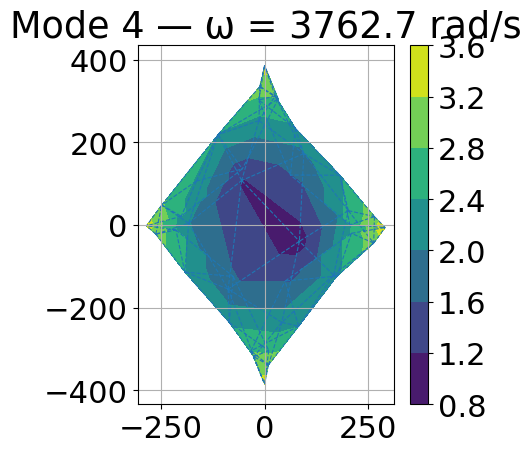

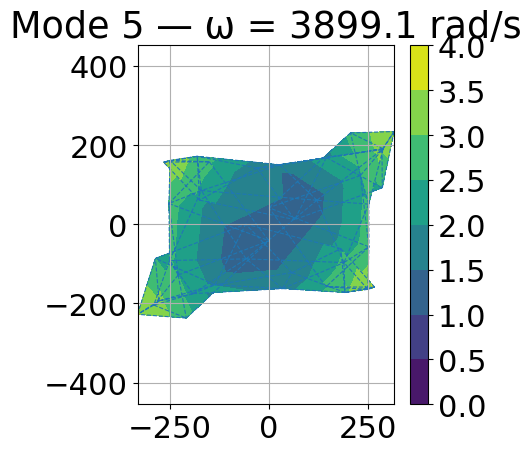

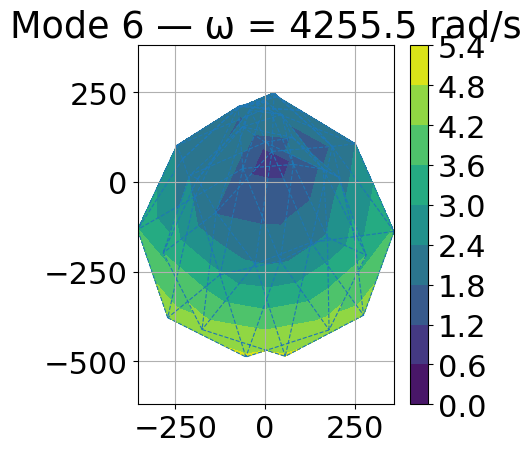

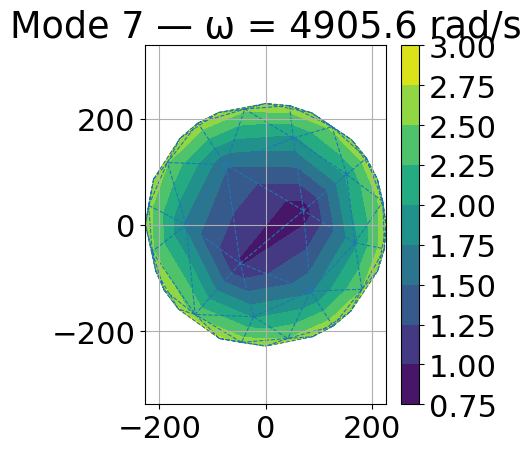

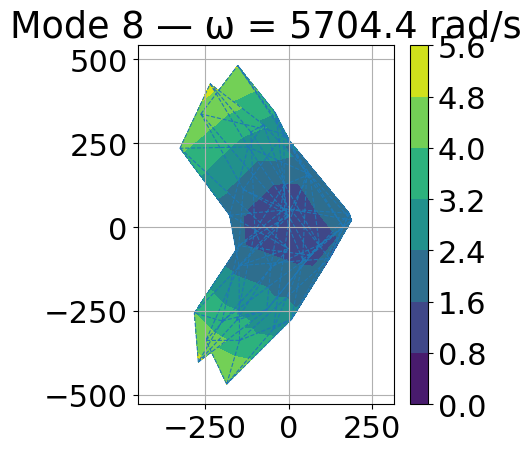


=== Maillage 2 ===
ω (rad/s) : ['3703.4', '3830.9', '4214.2', '4868.0', '5560.7']


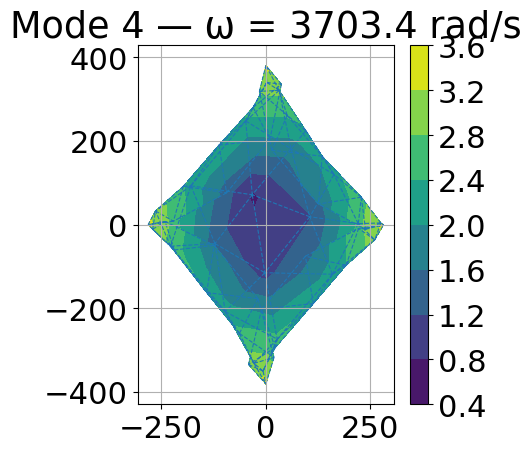

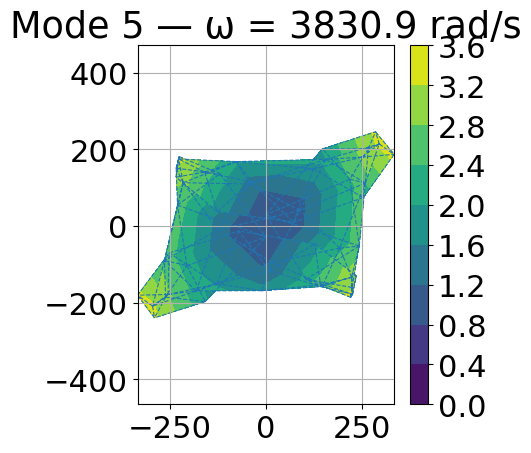

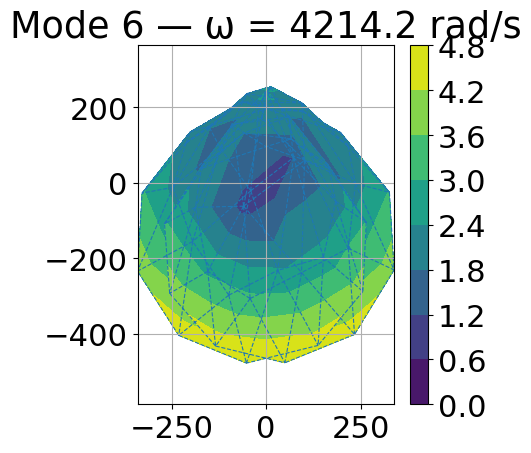

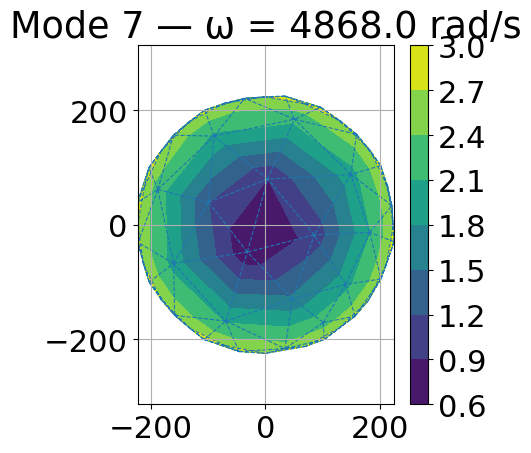

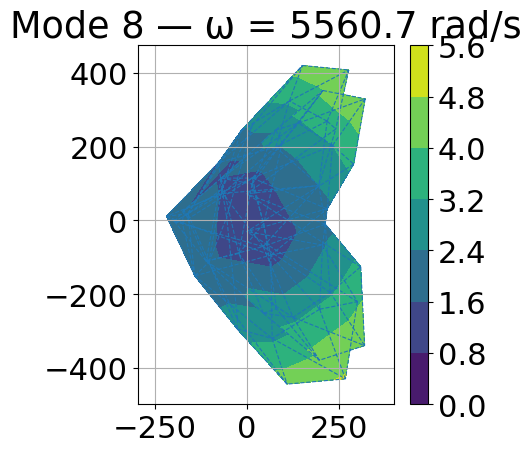


=== Maillage 3 ===
ω (rad/s) : ['3703.3', '3818.8', '4213.3', '4868.0', '5474.1']


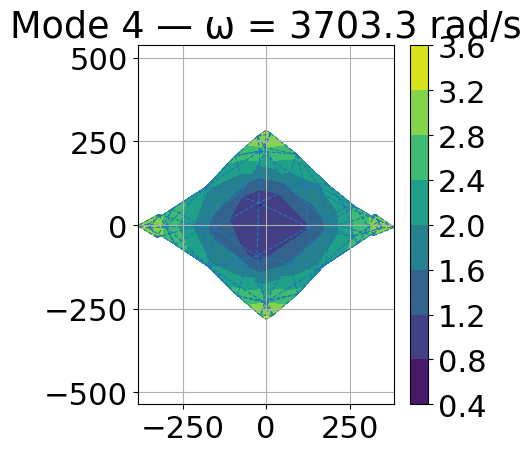

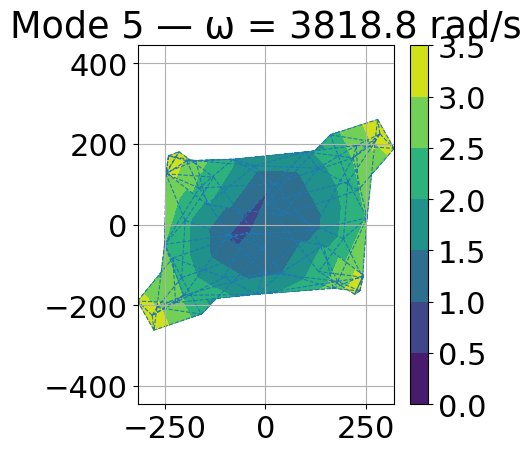

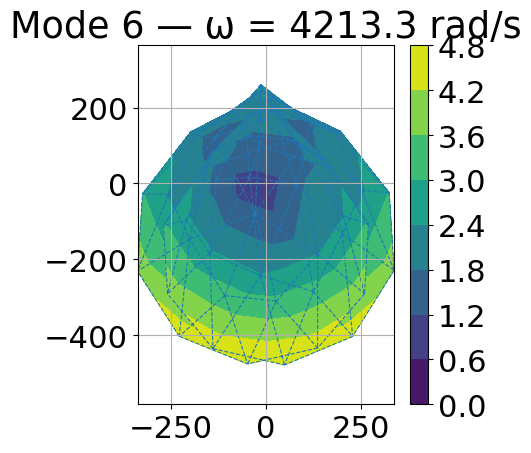

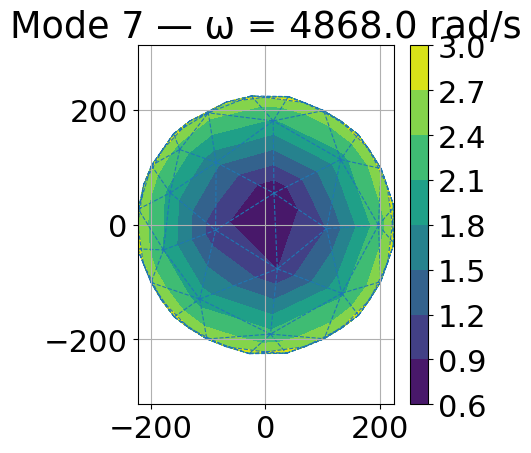

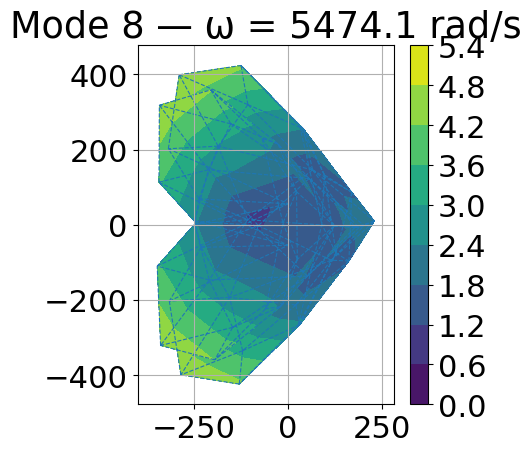


=== Maillage 4 ===
ω (rad/s) : ['3673.7', '3760.5', '4159.5', '4846.2', '5373.1']


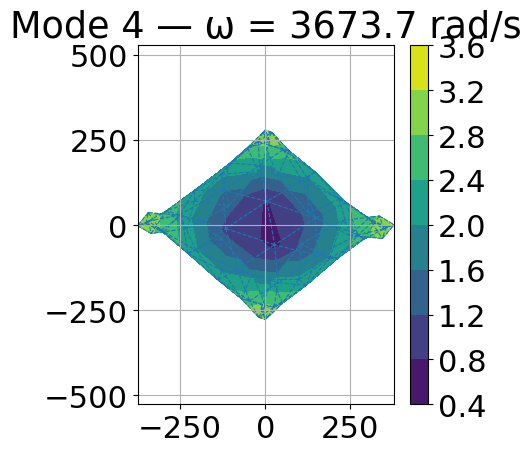

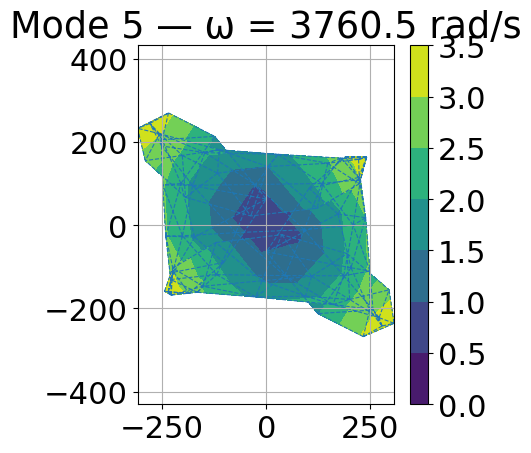

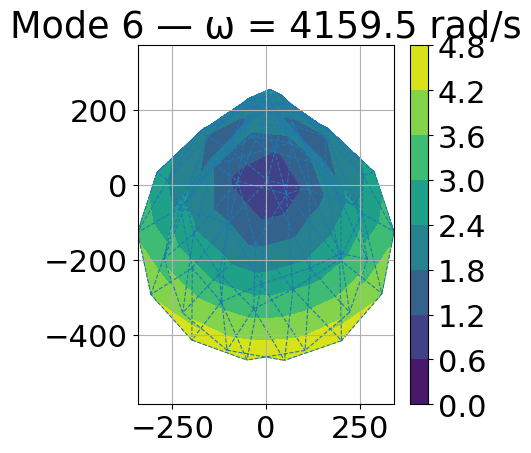

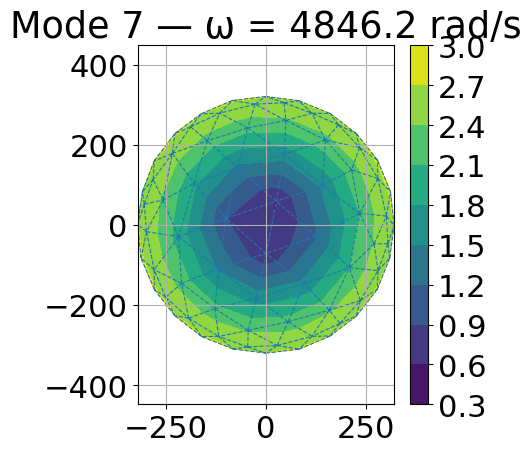

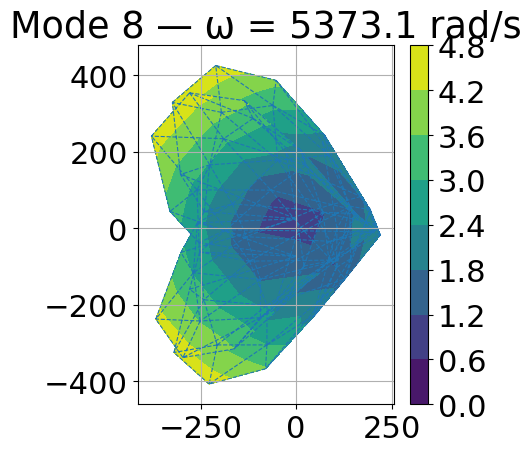


=== Maillage 5 ===
ω (rad/s) : ['3648.3', '3730.5', '4137.2', '4832.3', '5295.8']


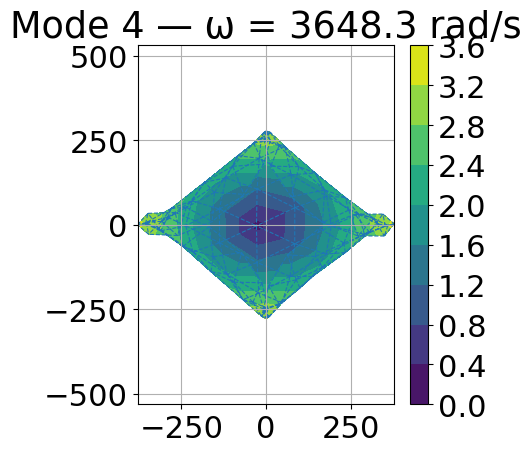

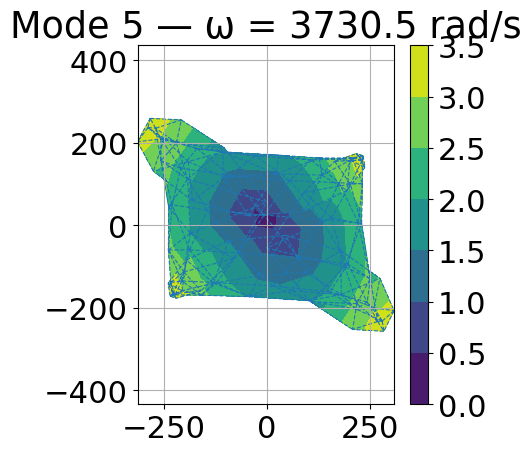

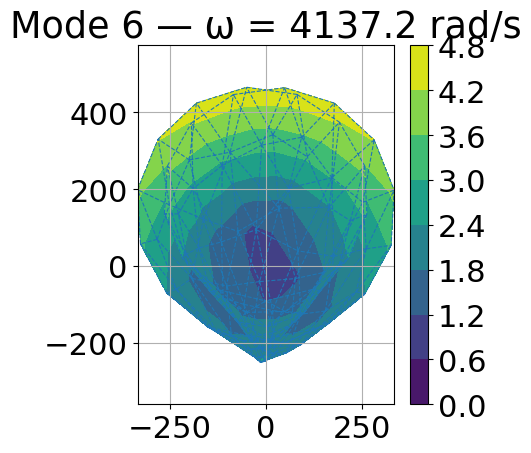

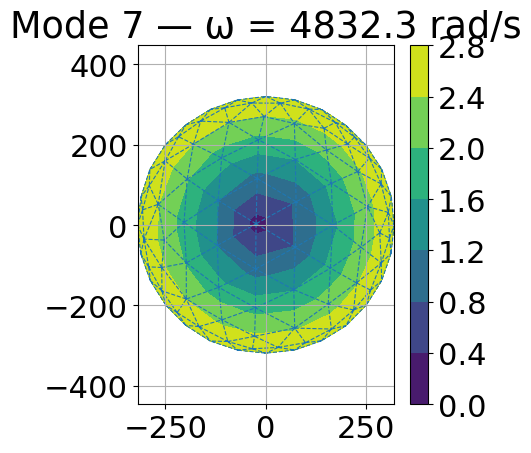

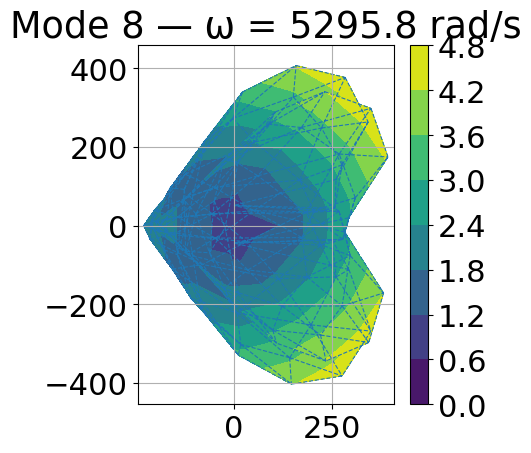

In [8]:
# --- FONCTIONS UTILITAIRES ---
def calculerN(X, noeuds):
    s = X[0]
    t = X[1]
    N1 = 1 - s - t
    N2 = s
    N3 = t
    return np.array([[N1, 0, N2, 0, N3, 0],
                     [0, N1, 0, N2, 0, N3]])

def calculerMatriceMasseLocale(connectivite_element, coordonnees):
    rho = 2.4e-6
    quads = [[1/6, 1/6], [2/3, 1/6], [1/6, 2/3]]
    weights = [1/6, 1/6, 1/6]
    noeuds = coordonnees[connectivite_element.ravel(), :]
    M_local = np.zeros((6, 6))
    for x_q, w_q in zip(quads, weights):
        N = calculerN(x_q, noeuds)
        B, J = calculerBetJ(x_q, noeuds)
        detJ = np.linalg.det(J)
        M_local += w_q * rho * N.T @ N * detJ
    return 10. * M_local

def assemblerMatriceMasse(connectivite, coordonnees):
    n_elem = connectivite.shape[0]
    n_nodes = coordonnees.shape[0]
    numEq = calculerNumerosEquations(connectivite)
    M = np.zeros((n_nodes * 2, n_nodes * 2))
    for e in range(n_elem):
        ddl = numEq[e, :]
        connectivite_element = connectivite[e, :]
        M_locale = calculerMatriceMasseLocale(connectivite_element, coordonnees)
        for i, gi in enumerate(ddl):
            for j, gj in enumerate(ddl):
                M[gi, gj] += M_locale[i, j]
    return M

# --- TRAITEMENT MODAL ---
amplification = 100

for idx, (coords, conn) in enumerate(zip(coords_list, conn_list)):
    M = assemblerMatriceMasse(conn, coords)
    K = assemblerMatriceRigidite(conn, coords)
    n_nodes = coords.shape[0]
    blocages = blocages_bresilien(coords)
    libres = np.logical_not(blocages)

    M_reduit = M[libres, :][:, libres]
    K_reduit = K[libres, :][:, libres]

    K_dense = K_reduit.toarray() if hasattr(K_reduit, "toarray") else K_reduit
    M_dense = M_reduit.toarray() if hasattr(M_reduit, "toarray") else M_reduit

    eig_vals, eig_vects = eigh(K_dense, M_dense)
    eig_vals = eig_vals.real
    eig_vects = eig_vects.real

    sorted_modes = np.argsort(eig_vals)
    eig_vals = eig_vals[sorted_modes]
    eig_vects = eig_vects[:, sorted_modes]

    omegas = [np.sqrt(eig_vals[i + 3]) for i in range(5)]

    print(f"\n=== Maillage {idx + 1} ===")
    print(f"ω (rad/s) : {[f'{w:.1f}' for w in omegas]}")

    u = np.zeros(2 * n_nodes)
    for mode_id in range(5):
        omega = omegas[mode_id]
        vecteur_propre = eig_vects[:, mode_id + 3]
        u[:] = 0
        u[libres] = vecteur_propre
        u_disp = coords + amplification * u.reshape(n_nodes, 2)

        plt.figure(figsize=(5, 5))  # ✅ une figure réduite par mode
        plotMesh(u_disp, conn, u)
        plt.title(f"Mode {mode_id + 4} — ω = {omega:.1f} rad/s")
        plt.axis("equal")
        plt.grid(True)
        plt.tight_layout()
        plt.show()



🔍 --- Vérification pour lc = 20 ---
  → Nombre de nœuds chargés (haut) : 1
  → Nombre de nœuds chargés (bas)  : 1
  → Force Y haut : [-100.]
  → Force Y bas  : [100.]
  → Somme totale Y : 0.0
  → DOF bloqués : 2
  → Blocages UX : [1 3]
  → Blocages UY : []


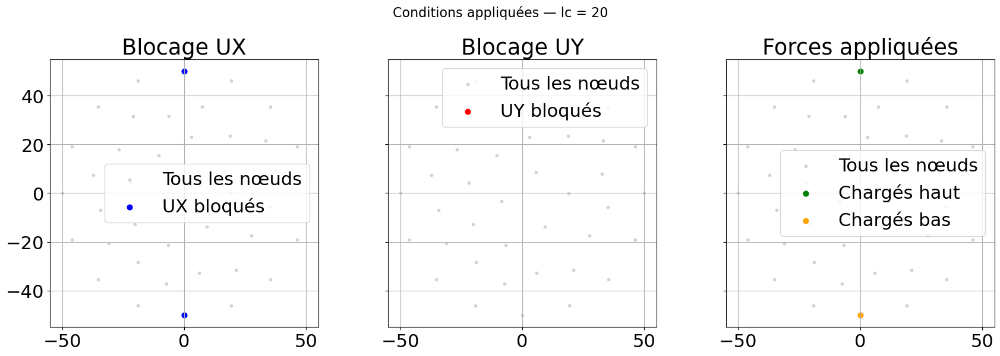

  → σ₁ centre (élément 14) : 0.059 N/mm²
  → Erreur relative : -7.2213 %

🔍 --- Vérification pour lc = 18 ---
  → Nombre de nœuds chargés (haut) : 1
  → Nombre de nœuds chargés (bas)  : 1
  → Force Y haut : [-100.]
  → Force Y bas  : [100.]
  → Somme totale Y : 0.0
  → DOF bloqués : 2
  → Blocages UX : [1 3]
  → Blocages UY : []


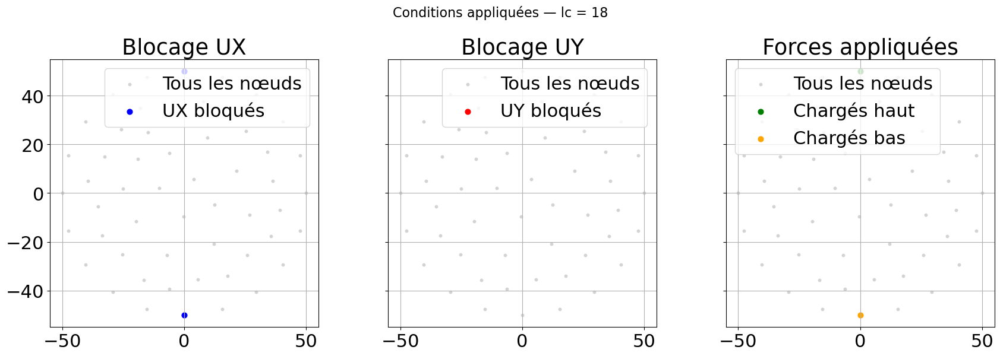

  → σ₁ centre (élément 33) : 0.059 N/mm²
  → Erreur relative : -7.8581 %

🔍 --- Vérification pour lc = 16 ---
  → Nombre de nœuds chargés (haut) : 1
  → Nombre de nœuds chargés (bas)  : 1
  → Force Y haut : [-100.]
  → Force Y bas  : [100.]
  → Somme totale Y : 0.0
  → DOF bloqués : 2
  → Blocages UX : [1 3]
  → Blocages UY : []


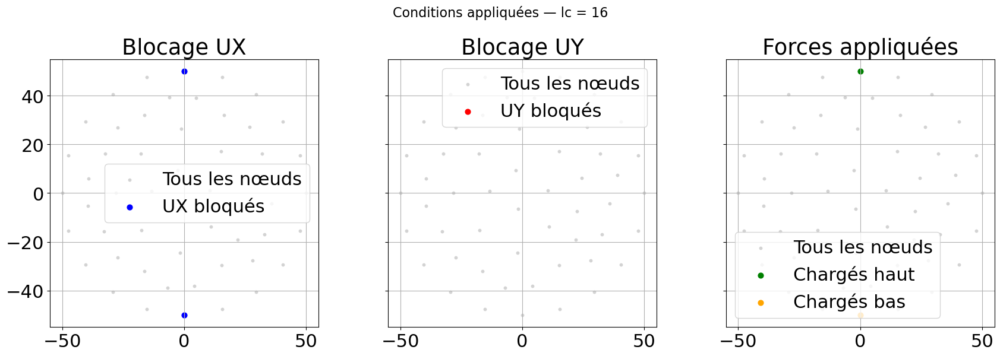

  → σ₁ centre (élément 33) : 0.054 N/mm²
  → Erreur relative : -15.5225 %

🔍 --- Vérification pour lc = 14 ---
  → Nombre de nœuds chargés (haut) : 1
  → Nombre de nœuds chargés (bas)  : 1
  → Force Y haut : [-100.]
  → Force Y bas  : [100.]
  → Somme totale Y : 0.0
  → DOF bloqués : 2
  → Blocages UX : [1 3]
  → Blocages UY : []


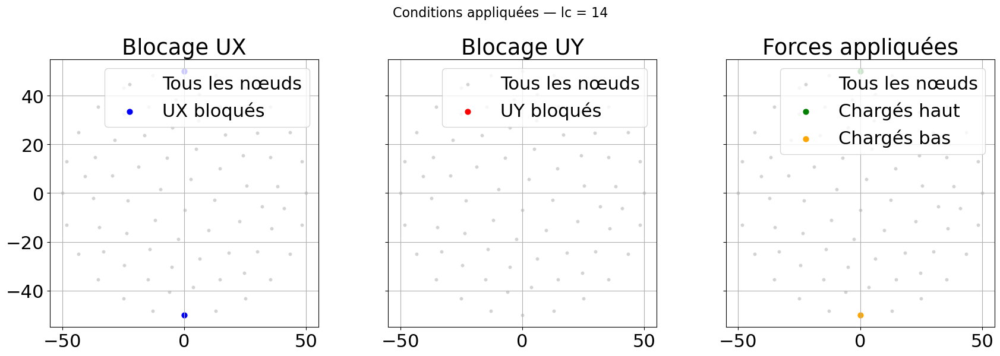

  → σ₁ centre (élément 41) : 0.059 N/mm²
  → Erreur relative : -7.9512 %

🔍 --- Vérification pour lc = 12 ---
  → Nombre de nœuds chargés (haut) : 1
  → Nombre de nœuds chargés (bas)  : 1
  → Force Y haut : [-100.]
  → Force Y bas  : [100.]
  → Somme totale Y : 0.0
  → DOF bloqués : 2
  → Blocages UX : [1 3]
  → Blocages UY : []


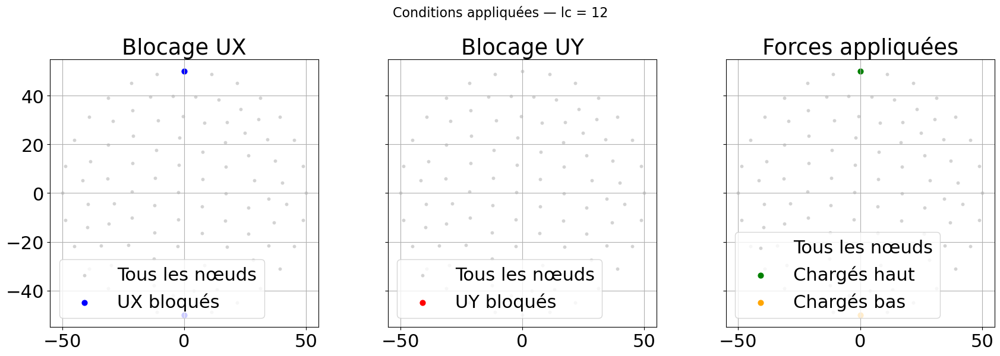

  → σ₁ centre (élément 69) : 0.061 N/mm²
  → Erreur relative : -3.5929 %
Convergence des erreurs relatives : ['-7.2213%', '-7.8581%', '-15.5225%', '-7.9512%', '-3.5929%']


In [9]:
def sigma1_centre_disc(coords, conn, contraintes):
    """
    Trouve la contrainte principale σ₁ dans l’élément le plus proche du centre.
    """
    distances = []
    for elem in conn:
        centroid = np.mean(coords[elem], axis=0)
        dist = np.linalg.norm(centroid)  # distance à l’origine (0,0)
        distances.append(dist)

    idx_min = np.argmin(distances)
    sxx, syy, txy = contraintes[idx_min]
    moy = 0.5 * (sxx + syy)
    rac = np.sqrt(((sxx - syy)/2)**2 + txy**2)
    sigma1 = moy + rac

    return sigma1, idx_min

Ftotale = 100  # exemple

erreur_list = []

for i, lc in enumerate(lc_values):
    suffix = str(lc).replace('.', '_')
    coords = coords_list[i]
    conn = conn_list[i]
    noeuds_haut = noeuds_haut_list[i]
    noeuds_bas = noeuds_bas_list[i]

    print(f"\n🔍 --- Vérification pour lc = {lc} ---")

    # Calcul de la force répartie
    F = calculerFcompression_simple(coords, noeuds_haut, noeuds_bas, Ftotale)
    F_repartie = F.reshape(-1, 2)

    # Blocages
    blocages = blocages_bresilien(coords)
    libres = np.logical_not(blocages)
    blocages_reshaped = blocages.reshape(-1, 2)

    # Infos
    print("  → Nombre de nœuds chargés (haut) :", len(noeuds_haut))
    print("  → Nombre de nœuds chargés (bas)  :", len(noeuds_bas))
    print("  → Force Y haut :", F_repartie[noeuds_haut, 1])
    print("  → Force Y bas  :", F_repartie[noeuds_bas, 1])
    print("  → Somme totale Y :", np.sum(F_repartie[:, 1]))

    bloques_ux = np.where(blocages_reshaped[:, 0])[0]
    bloques_uy = np.where(blocages_reshaped[:, 1])[0]
    print("  → DOF bloqués :", np.sum(~libres))
    print("  → Blocages UX :", bloques_ux)
    print("  → Blocages UY :", bloques_uy)

    # Recalcul des infos pour affichage
    blocages_reshaped = blocages.reshape(-1, 2)
    bloques_ux = np.where(blocages_reshaped[:, 0])[0]
    bloques_uy = np.where(blocages_reshaped[:, 1])[0]

    # Plot de vérification des conditions imposées
    fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharex=True, sharey=True)

    for ax in axes:
        ax.scatter(coords[:, 0], coords[:, 1], s=10, color='lightgray', label="Tous les nœuds")
        ax.set_aspect("equal")
        ax.grid(True)

    axes[0].scatter(coords[bloques_ux, 0], coords[bloques_ux, 1], s=40, color='blue', label="UX bloqués")
    axes[0].set_title("Blocage UX")
    axes[0].legend()

    axes[1].scatter(coords[bloques_uy, 0], coords[bloques_uy, 1], s=40, color='red', label="UY bloqués")
    axes[1].set_title("Blocage UY")
    axes[1].legend()

    axes[2].scatter(coords[noeuds_haut, 0], coords[noeuds_haut, 1], s=40, color='green', label="Chargés haut")
    axes[2].scatter(coords[noeuds_bas, 0], coords[noeuds_bas, 1], s=40, color='orange', label="Chargés bas")
    axes[2].set_title("Forces appliquées")
    axes[2].legend()

    plt.suptitle(f"Conditions appliquées — lc = {lc}", fontsize=16)
    plt.tight_layout()
    plt.show()

    # Résolution
    u = np.zeros(coords.shape[0] * 2)
    K = assemblerMatriceRigidite(conn, coords)
    u[libres] = np.linalg.solve(K[libres][:, libres], F[libres])
    contraintes = calculer_contraintes_elements(u, coords, conn)

    # Extraction σ₁ centre
    sigma1_centre, elem_central = sigma1_centre_disc(coords, conn, contraintes)
    print(f"  → σ₁ centre (élément {elem_central}) : {sigma1_centre:.3f} N/mm²")

    sigma_théorique = 2 / (np.pi * 10)  # disque e=10 mm
    erreur_relative = (sigma1_centre - sigma_théorique) / sigma_théorique * 100
    print(f"  → Erreur relative : {erreur_relative:.4f} %")
    erreur_list.append(erreur_relative)

print("Convergence des erreurs relatives :", [f"{e:.4f}%" for e in erreur_list])


--- Résultat pour lc = 20 mm ---
Norme de K : 7.76e+06
Max coordonnée : 50.00 mm
✅ Pas de rupture jusqu’à Fmax = 4800 N (σ₁ centre = 2.84)
Erreur relative : 5.3715 %


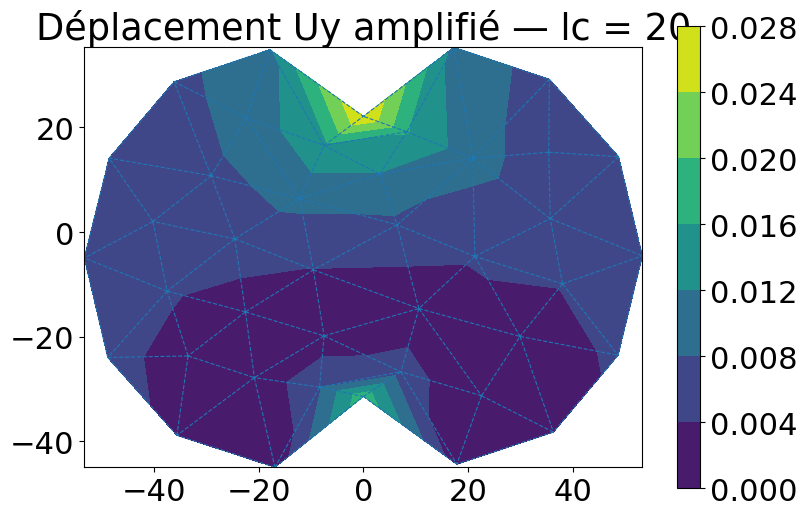

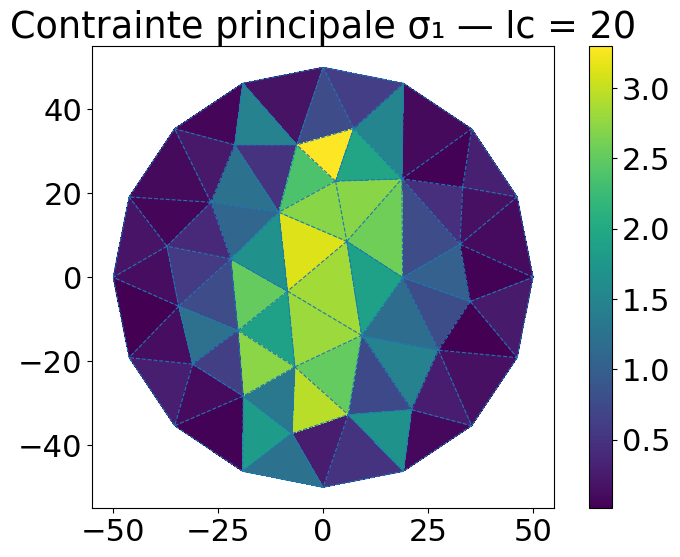


--- Résultat pour lc = 18 mm ---
Norme de K : 8.88e+06
Max coordonnée : 50.00 mm
✅ Pas de rupture jusqu’à Fmax = 4800 N (σ₁ centre = 2.82)
Erreur relative : 5.3715 %


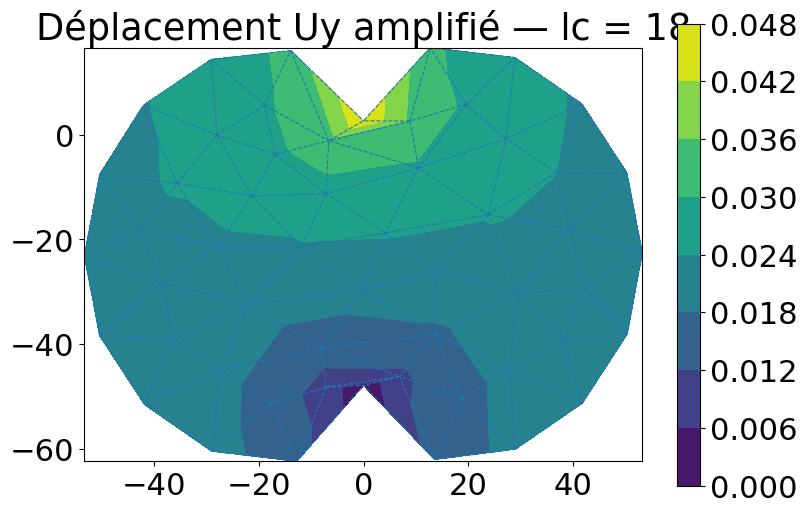

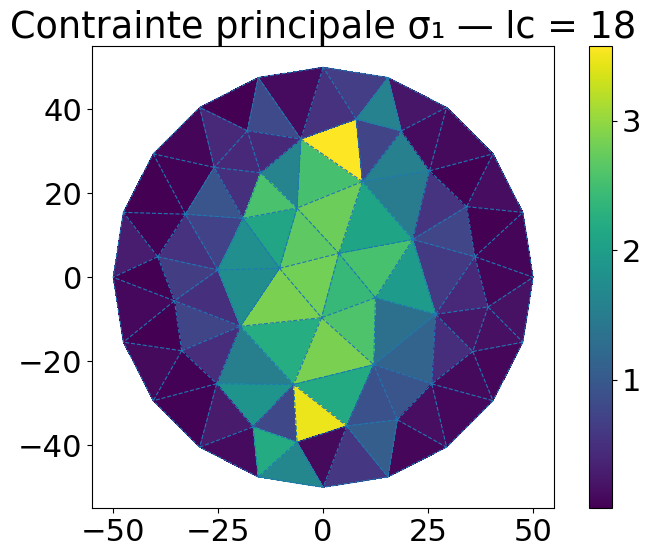


--- Résultat pour lc = 16 mm ---
Norme de K : 8.88e+06
Max coordonnée : 50.00 mm
✅ Pas de rupture jusqu’à Fmax = 4800 N (σ₁ centre = 2.58)
Erreur relative : 5.3715 %


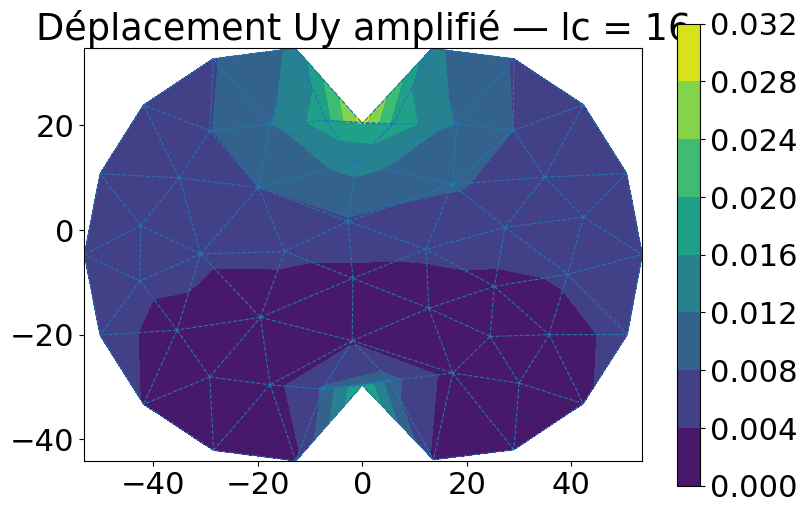

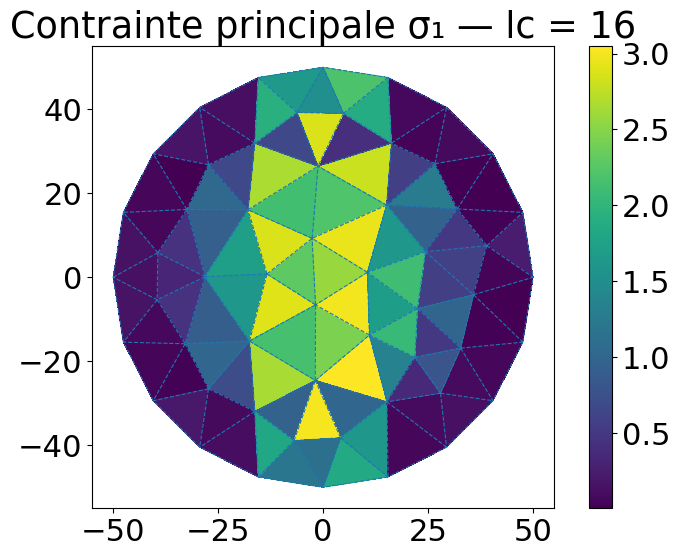


--- Résultat pour lc = 14 mm ---
Norme de K : 1.05e+07
Max coordonnée : 50.00 mm
✅ Pas de rupture jusqu’à Fmax = 4800 N (σ₁ centre = 2.81)
Erreur relative : 5.3715 %


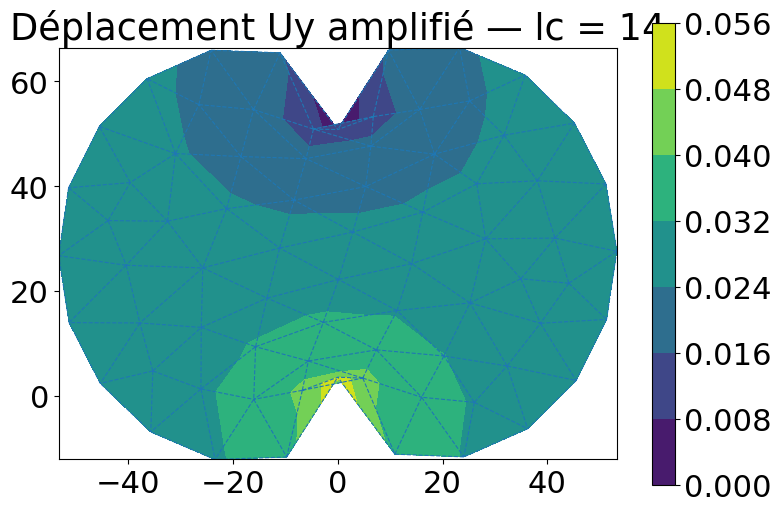

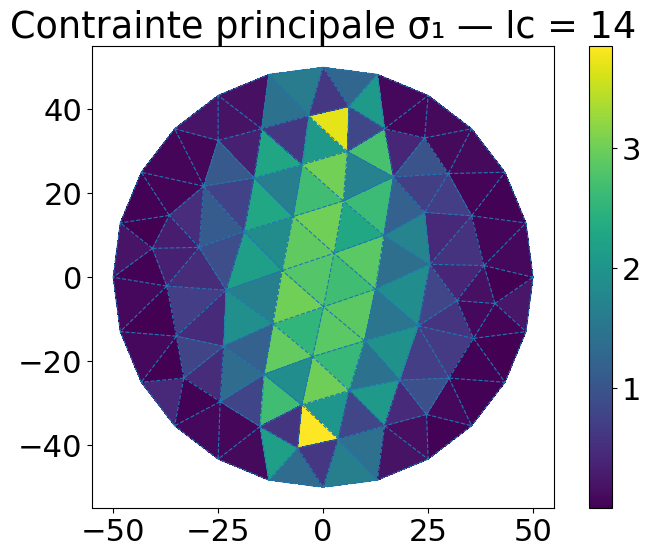


--- Résultat pour lc = 12 mm ---
Norme de K : 1.21e+07
Max coordonnée : 50.00 mm
💥 Rupture détectée à F ≈ 4725.12 N (σ₁ centre ≈ 2.90 ≥ 2.90)
Erreur relative : 3.7277 %


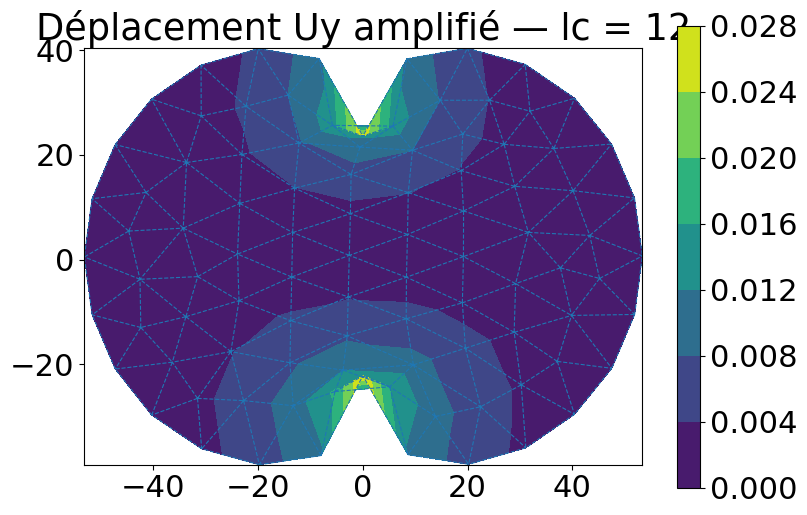

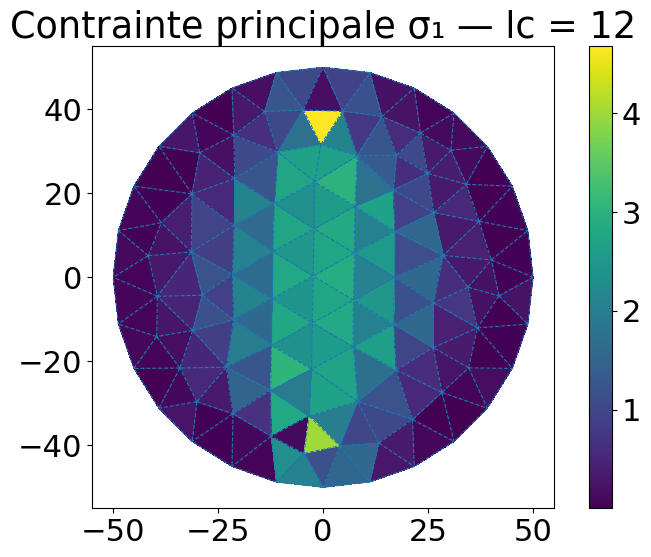

Convergence des erreurs relatives : ['5.3715%', '5.3715%', '5.3715%', '5.3715%', '3.7277%']


In [10]:
erreur_list = []
for i, lc in enumerate(lc_values):
    suffix = str(lc).replace(".", "_")
    coords = coords_list[i]
    conn = conn_list[i]
    noeuds_haut = noeuds_haut_list[i]
    noeuds_bas = noeuds_bas_list[i]

    print(f"\n--- Résultat pour lc = {lc} mm ---")

    K = assemblerMatriceRigidite(conn, coords)
    blocages = blocages_bresilien(coords)

    # Détection par dichotomie
    F_rupture, sigma1_centre, u = detecter_force_de_rupture_automatique(
        K, coords, conn, blocages,
        noeuds_haut, noeuds_bas,
        sigma_t=2.9, Fmin=4530, Fmax=4800, tol=0.1
    )

    u_disp = u.reshape(-1, 2)
    contraintes = calculer_contraintes_elements(u, coords, conn)
    contraintes_princ = np.array([contraintes_principales(sigma) for sigma in contraintes])
    sigma1_elements = contraintes_princ[:, 0]

    # Erreur sur la force de rupture
    valeur_theorique = 2.9 * np.pi * 100 * 10 / 2
    erreur_rel = (F_rupture - valeur_theorique) / valeur_theorique * 100
    print(f"Erreur relative : {erreur_rel:.4f} %")
    erreur_list.append(erreur_rel)
    
    # Plot 1 : Déplacement Uy amplifié
    amplification = 1e3
    plt.figure()
    plotMesh(coords + amplification * u_disp, conn, nodal_field=u_disp[:, 1])
    plt.title(f"Déplacement Uy amplifié — lc = {lc}")
    plt.show()

    # Plot 2 : Contrainte principale σ₁
    plt.figure()
    plotMesh(coords, conn, elemental_field=sigma1_elements)
    plt.title(f"Contrainte principale σ₁ — lc = {lc}")
    plt.show()

print("Convergence des erreurs relatives :", [f"{e:.4f}%" for e in erreur_list])

# Avec T6

In [11]:
def readMesh6(filename):
    """
    Lit un fichier .msh généré par Gmsh et retourne les coordonnées et la connectivité T6.
    """
    msh = meshio.read(filename)

    # Coordonnées des points
    points = msh.points[:, :2]  # On garde seulement x, y

    # Cherche les éléments de type triangle à 6 nœuds (triangle6)
    cells = None
    for cell_block in msh.cells:
        if cell_block.type == "triangle6":
            cells = cell_block.data
            break

    if cells is None:
        raise ValueError("Aucun élément triangle6 trouvé dans le fichier msh.")

    return points, cells

def meshGeo6(filename, dim=2, order=2):
    """
    Generates a mesh using gmsh and returns the mesh read from the generated file.
    """
    ret = subprocess.run(f"gmsh -2 -order {order} -o tmp.msh {filename}", shell=True)
    if ret.returncode:
        print("Beware, gmsh could not run: mesh is not generated")
        return None
    else:
        print("Mesh generated")
        mesh = readMesh6("tmp.msh")
        os.remove("tmp.msh")
        return mesh


def plotT6Mesh(points, conn, nodal_field=None, axis=None, linestyle='-'):
    ax = plt.gca()

    points_used = points.copy()
    triangles = []

    # --- Gestion du champ nodal ---
    if nodal_field is not None:
        nodal_field = nodal_field.reshape(points.shape[0], -1)

        if nodal_field.shape[1] > 1:
            if axis is None:
                print("⚠️ Attention : champ vectoriel détecté, utilisation de la norme ||u||. "
                      "Passez axis=0 ou axis=1 pour une composante spécifique.")
                nodal_field_used = np.linalg.norm(nodal_field, axis=1).reshape(-1, 1)
            else:
                nodal_field_used = nodal_field[:, axis].reshape(-1, 1)
        else:
            nodal_field_used = nodal_field.copy()
    else:
        nodal_field_used = None

    # --- Construction des triangles (découpe T6) ---
    for tri6 in conn:
        n0, n1, n2, m0, m1, m2 = tri6

        # Centre du triangle
        x_centre = (points[n0][0] + points[n1][0] + points[n2][0]) / 3
        y_centre = (points[n0][1] + points[n1][1] + points[n2][1]) / 3
        centre_index = len(points_used)
        points_used = np.vstack([points_used, [x_centre, y_centre]])

        if nodal_field is not None:
            valeur_centre = (nodal_field_used[n0] + nodal_field_used[n1] + nodal_field_used[n2]) / 3
            nodal_field_used = np.vstack([nodal_field_used, valeur_centre.reshape(1, -1)])

        # Ajoute 6 triangles pour T6
        triangles += [
            [n0, m0, centre_index],
            [m0, n1, centre_index],
            [n1, m1, centre_index],
            [m1, n2, centre_index],
            [n2, m2, centre_index],
            [m2, n0, centre_index],
        ]

    triangles = np.array(triangles)
    triang = tri.Triangulation(points_used[:, 0], points_used[:, 1], triangles)

    # --- Affichage du champ nodal ---
    if nodal_field is not None:
        contour = plt.tricontourf(triang, nodal_field_used[:, 0], cmap='viridis')
        plt.colorbar(contour)

    # --- Arêtes réelles du T6 + points rouges ---
    for triangle in conn:
        coords = points[triangle]
        edges = [(0, 3), (3, 1), (1, 4), (4, 2), (2, 5), (5, 0)]

        # Affiche les arêtes
        for i1, i2 in edges:
            x = [coords[i1][0], coords[i2][0]]
            y = [coords[i1][1], coords[i2][1]]
            ax.plot(x, y, 'k', linestyle=linestyle, linewidth=1.5)

        # Affiche les 6 nœuds rouges (coins + milieux d’arêtes)
        for i in range(6):
            ax.plot(coords[i][0], coords[i][1], 'ro', markersize=4)

    ax.set_aspect('equal')
    ax.grid(True)


Info    : Reading 'disque_T6_lc_20.geo'...
Info    : Done reading 'disque_T6_lc_20.geo'
Info    : Meshing 1D...
Info    : [  0%] Meshing curve 1 (Circle)
Info    : [ 30%] Meshing curve 2 (Circle)
Info    : [ 60%] Meshing curve 3 (Circle)
Info    : [ 80%] Meshing curve 4 (Circle)
Info    : Done meshing 1D (Wall 0.000127667s, CPU 0.000124s)
Info    : Meshing 2D...
Info    : Meshing surface 6 (Plane, Frontal-Delaunay)
Info    : Done meshing 2D (Wall 0.000499375s, CPU 0.000499s)
Info    : 42 nodes 85 elements
Info    : Writing 'disque_T6_lc_20.msh'...
Info    : Done writing 'disque_T6_lc_20.msh'
Info    : Running '/Users/romain/miniconda3/envs/MNSS/bin/gmsh -2 -order 2 -o tmp.msh disque_T6_lc_20.msh' [Gmsh 4.15.2, 1 node, max. 1 thread]
Info    : Started on Tue Apr 21 15:53:31 2026
Info    : Reading 'disque_T6_lc_20.msh'...
Info    : 10 entities
Info    : 41 nodes
Info    : 72 elements
Info    : Done reading 'disque_T6_lc_20.msh'
Info    : Meshing 1D...
Info    : Done meshing 1D (Wall 1.23

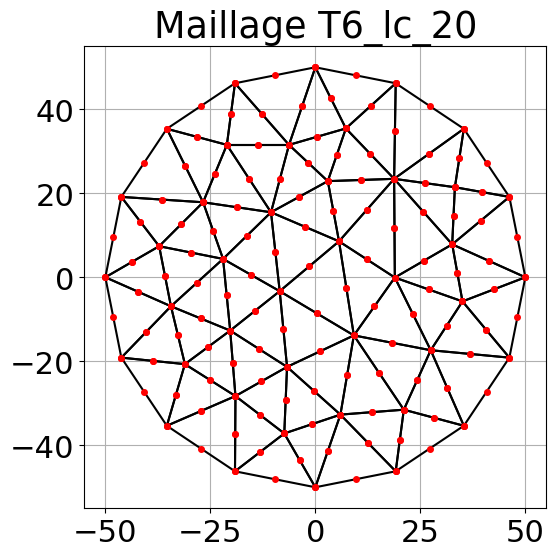

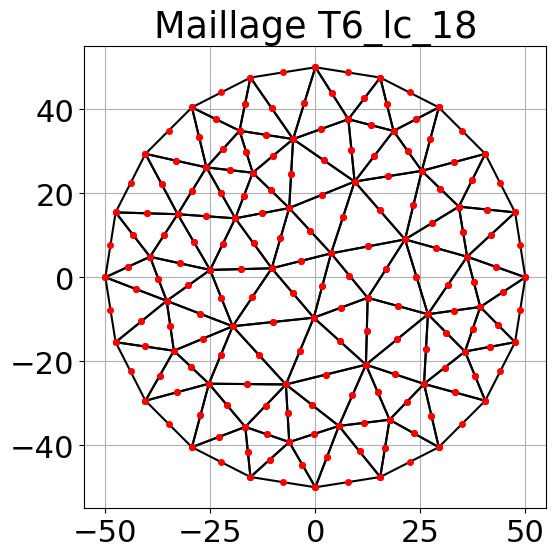

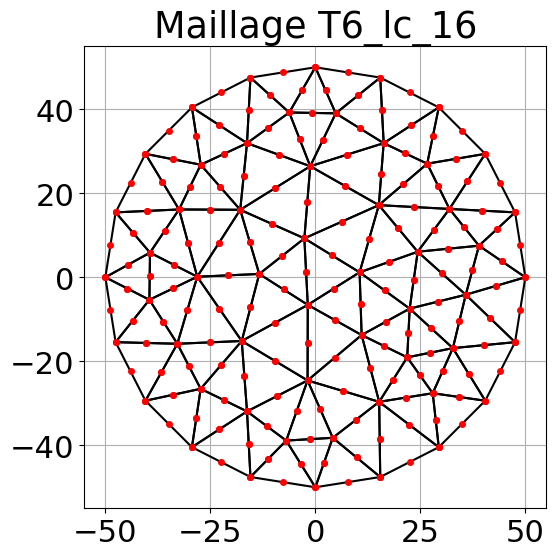

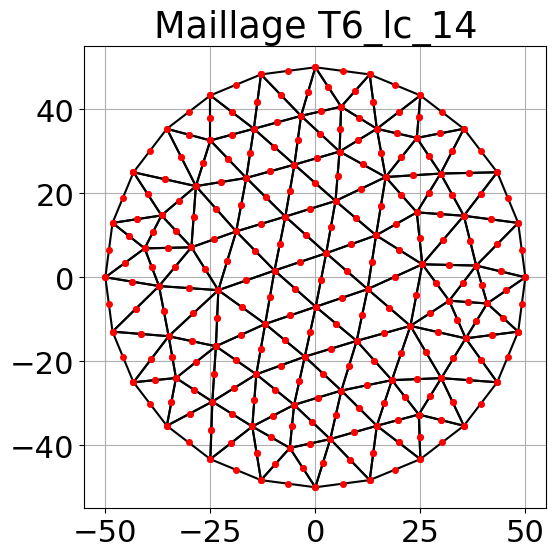

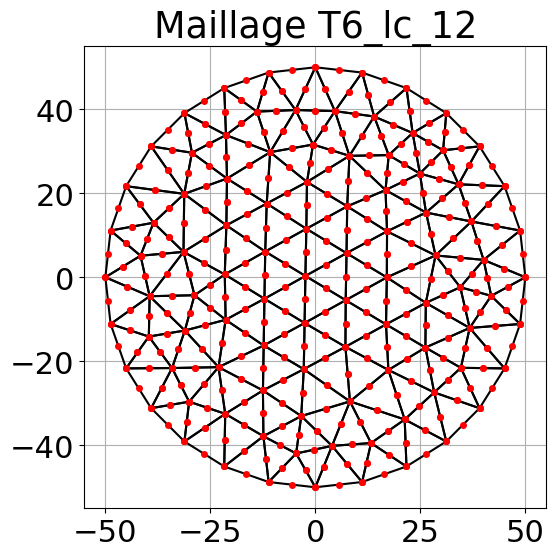

In [12]:
def generer_geo_disque(r=50.0, lc=5.0, nom_geo="disque.geo", nom_msh="disque.msh"):
    contenu_geo = f"""
    lc = {lc};
    r = {r};
    xc = 0.0;
    yc = 0.0;
    
    Point(1) = {{xc + r, yc, 0, lc}};
    Point(2) = {{xc, yc + r, 0, lc}};
    Point(3) = {{xc - r, yc, 0, lc}};
    Point(4) = {{xc, yc - r, 0, lc}};
    Point(5) = {{xc, yc, 0, lc}};
    
    Circle(1) = {{1, 5, 2}};
    Circle(2) = {{2, 5, 3}};
    Circle(3) = {{3, 5, 4}};
    Circle(4) = {{4, 5, 1}};
    
    Line Loop(5) = {{1, 2, 3, 4}};
    Plane Surface(6) = {{5}};
    Physical Surface(7) = {{6}};
    Physical Line(8) = {{2}}; // demi-cercle supérieur
    Physical Line(9) = {{4}}; // demi-cercle inférieur
    """
    with open(nom_geo, 'w') as f:
        f.write(contenu_geo)

    # Génération du .msh directement après le .geo
    gmsh.initialize()
    gmsh.open(nom_geo)
    gmsh.model.mesh.generate(2)
    gmsh.write(nom_msh)
    gmsh.finalize()

    return nom_geo, nom_msh


# ------------------------
# Génération des maillages
# ------------------------

lc_values =  np.arange(20, 10, -2)
r = 50.0

nodes_T6_dict = {}
conn_T6_dict = {}

for order in [2]:  # 1 = T3, 2 = T6
    for lc in lc_values:
        suffix = f"T{order*3}_lc_{str(lc).replace('.', '_')}"
        geo_file = f"disque_{suffix}.geo"
        msh_file = f"disque_{suffix}.msh"

        generer_geo_disque(r=r, lc=lc, nom_geo=geo_file, nom_msh=msh_file)

        # Choix lecture selon ordre
        if order == 1:
            coords, conn = meshGeo(msh_file, order=order)
        elif order == 2:
            coords, conn = meshGeo6(msh_file)

        nodes_T6_dict[suffix] = coords
        conn_T6_dict[suffix] = conn

        plt.figure()
        plotT6Mesh(coords, conn)  
        plt.title(f"Maillage {suffix}")

In [13]:
# Get the first key (e.g., 'T6_lc_10')
first_key = list(nodes_T6_dict.keys())[0]

# Get the corresponding arrays
coords_first = nodes_T6_dict[first_key]
conn_first = conn_T6_dict[first_key]

# Print information
print(f"First mesh: {first_key}")
print(f"  → Number of nodes: {len(coords_first)}")
print(f"  → Number of elements: {len(conn_first)}")
print(f"  → Nodes per element: {conn_first.shape[1]}")


First mesh: T6_lc_20
  → Number of nodes: 145
  → Number of elements: 64
  → Nodes per element: 6


In [14]:
def calculerD(contraintes_planes=True):
    
    E = 33600 
    nu = 0.2    

    # On fait des contraintes planes par défaut
    if contraintes_planes:
        D = (E/(1-nu**2))* np.array(
            [[1,  nu, 0],
             [nu, 1,  0],
             [0,  0,  (1-nu)/2]])
    else:
        raise RuntimeError('Déformations planes à implémenter!')
    return D

def C_matrix_T6(s, t):
    # Dérivées manuelles de N_i(s, t)
    N1s, N1t = 4*s + 4*t - 3,     4*s + 4*t - 3
    N2s, N2t = 4*s - 1,           0
    N3s, N3t = 0,                 4*t - 1
    N4s, N4t = 4 - 8*s - 4*t,     -4*s
    N5s, N5t = 4*t,               4*s
    N6s, N6t = -4*t,              4 - 4*s - 8*t


    C = np.array([
        [N1s, 0, N2s, 0, N3s, 0, N4s, 0, N5s, 0, N6s, 0],
        [N1t, 0, N2t, 0, N3t, 0, N4t, 0, N5t, 0, N6t, 0],
        [0, N1s, 0, N2s, 0, N3s, 0, N4s, 0, N5s, 0, N6s],
        [0, N1t, 0, N2t, 0, N3t, 0, N4t, 0, N5t, 0, N6t],
    ])

    return C 

def J_T6(s, t, x):
    x1, y1 = x[0, :]
    x2, y2 = x[1, :]
    x3, y3 = x[2, :]
    x4, y4 = x[3, :]
    x5, y5 = x[4, :]
    x6, y6 = x[5, :]

    # Fonctions d'interpolation T6 (quadratiques)
    N1 = (1 - s - t)*(1 - 2*s - 2*t)
    N2 = s*(2*s - 1)
    N3 = t*(2*t - 1)
    N4 = 4*s*(1 - s - t)
    N5 = 4*s*t
    N6 = 4*t*(1 - s - t)

    # Interpolation de x(s,t) et y(s,t)
    x_st = N1*x1 + N2*x2 + N3*x3 + N4*x4 + N5*x5 + N6*x6
    y_st = N1*y1 + N2*y2 + N3*y3 + N4*y4 + N5*y5 + N6*y6

    # Dérivées partielles pour construire le Jacobien
    J = Matrix([
        [x_st.diff(s), y_st.diff(s)],
        [x_st.diff(t), y_st.diff(t)]
    ])

    return simplify(J)

A = np.array([
    [1, 0, 0, 0],  # d/dx
    [0, 0, 0, 1],  # d/dy
    [0, 1, 1, 0]   # d/dx + d/dy
])

def Mat_J_T6(noeuds, s, t):
    s_sym, t_sym = symbols('s t')
    J_sym = J_T6(s_sym, t_sym, noeuds)
    J_num = np.array(J_sym.evalf(subs={s_sym: s, t_sym: t})).astype(np.float64)

    Jblock = np.zeros((4, 4))
    Jblock[0:2, 0:2] = J_num
    Jblock[2:4, 2:4] = J_num

    return np.linalg.inv(Jblock)

def calculerB_T6(noeuds, s, t):
    J_inv_ext = Mat_J_T6(noeuds, s, t)   
    C = C_matrix_T6(s, t)                
    return A @ J_inv_ext @ C 

def calculerMatriceRigiditeLocale(connectivite_element, coordonnees):
    # Quadrature d'ordre 2 pour triangle (3 points)
    quads = [
        [1/6, 1/6],
        [2/3, 1/6],
        [1/6, 2/3]
    ]
    weights = [1/6, 1/6, 1/6]

    # Récupération des 6 nœuds de l'élément
    noeuds = coordonnees[connectivite_element.ravel(), :]  # (6,2)
    K_local = np.zeros((12, 12))

    # Symboles pour le Jacobien
    s_sym, t_sym = symbols('s t')

    for (s_val, t_val), w_q in zip(quads, weights):

        # Calcul du Jacobien au point (s,t)
        J_sym = J_T6(s_sym, t_sym, noeuds)
        J_num = np.array(J_sym.evalf(subs={s_sym: s_val, t_sym: t_val})).astype(np.float64)
        detJ = np.linalg.det(J_num)

        # Vérification que detJ n'est pas trop petit
        if np.abs(detJ) < 1e-10:
            raise ValueError(f"Dét(J) trop proche de 0 au point (s={s_val}, t={t_val}) : det(J) = {detJ}")

        # Calcul de la matrice B au point (s,t)
        B = calculerB_T6(noeuds, s_val, t_val)

        # Matrice de rigidité locale
        D = calculerD()
        K_local += w_q * (B.T @ D @ B) * detJ

    # Application de l'épaisseur
    epaisseur = 10.0  # mm
    return epaisseur * K_local

def calculerNumerosEquations(connectivite):

    n_elem  = connectivite.shape[0]
    n_nodes_per_elem = connectivite.shape[1]
    numEq = np.zeros((n_elem, 2*n_nodes_per_elem), dtype=int)
    for e in range(n_elem):
        for i in range(n_nodes_per_elem):
            numEq[e, 2*i]   = 2*connectivite[e, i];
            numEq[e, 2*i+1] = 2*connectivite[e, i]+1;
    return numEq

def assemblerMatriceRigidite(connectivite, coordonnees):

    n_elem  = connectivite.shape[0]
    n_nodes = coordonnees.shape[0]
    numEq = calculerNumerosEquations(connectivite)

    K = np.zeros((n_nodes*2, n_nodes*2))
    for e in range(n_elem):
        # On récupère les degrés de liberté de l'élément e
        ddl = numEq[e, :]
        # On récupère les noeuds de l'élément e
        connectivite_element = connectivite[e, :]
        # On calcule la matrice de rigidite locale de l'élément e
        K_locale = calculerMatriceRigiditeLocale(connectivite_element, coordonnees)
        # On assemble
        for i, gi in enumerate(ddl):
            for j, gj in enumerate(ddl):
                K[gi, gj] += K_locale[i, j]
    return K

In [15]:
def calculer_contraintes_elements(u, coords, conn, E=33600, nu=0.2):
    """
    Calcule les contraintes σ = D * B * u pour chaque élément T6.
    """
    D = calculerD()
    contraintes = []

    for e in range(conn.shape[0]):
        element_nodes = conn[e]           # indices des 6 nœuds
        X = coords[element_nodes]         # coordonnées des 6 nœuds (6, 2)

        # Construction du vecteur de déplacement local u_elem (taille 12)
        u_elem = np.zeros(12)
        for i, node in enumerate(element_nodes):
            u_elem[2*i:2*i+2] = u[2*node:2*node+2]

        # Calcul de B au centre de l'élément (s = t = 1/3)
        B = calculerB_T6(X, s=1/3, t=1/3)

        # Contrainte élémentaire
        sigma = D @ B @ u_elem
        contraintes.append(sigma)

    return np.array(contraintes)

In [16]:
def calculerFcompression_sym(coords, noeuds_haut, noeuds_bas, F_totale):
    """
    Répartit F_totale sur le haut et le bas :
    - F/2 vers le bas sur les noeuds_haut
    - F/2 vers le haut sur les noeuds_bas
    """
    F = np.zeros((coords.shape[0], 2))

    F_haut = -F_totale / len(noeuds_haut)
    F_bas = F_totale / len(noeuds_bas)

    for idx in noeuds_haut:
        F[idx, 1] = F_haut
    for idx in noeuds_bas:
        F[idx, 1] = F_bas

    return F.ravel()

In [17]:
def blocages_bresilien(coords, tol=1.0):
    """
    Bloque :
    - UX sur le nœud le plus haut
    - UX sur le nœud le plus bas
    - UY sur le nœud le plus proche de x = 0
    """
    n = coords.shape[0]
    blocages = np.zeros((n, 2), dtype=bool)

    # UX en haut
    idx_haut = np.argmax(coords[:, 1])
    blocages[idx_haut, 0] = True

    # UX en bas
    idx_bas = np.argmin(coords[:, 1])
    blocages[idx_bas, 0] = True

    '''
    # UY au centre horizontal
    idx_centre = np.argmin(np.linalg.norm(coords, axis=1))
    blocages[idx_centre, 1] = True
    '''
    
    return blocages.ravel()

In [18]:
coords_list = []
conn_list = []
noeuds_haut_list = []
noeuds_bas_list = []

for lc in lc_values:
    suffix = f"T6_lc_{str(lc).replace('.', '_')}"
    msh_file = f"disque_{suffix}.msh"

    coords, conn = meshGeo6(msh_file)
    idx_haut = np.argmax(coords[:, 1])
    idx_bas = np.argmin(coords[:, 1])
    
    coords_list.append(coords)
    conn_list.append(conn)
    noeuds_haut_list.append(np.array([idx_haut]))
    noeuds_bas_list.append(np.array([idx_bas]))

Info    : Running '/Users/romain/miniconda3/envs/MNSS/bin/gmsh -2 -order 2 -o tmp.msh disque_T6_lc_20.msh' [Gmsh 4.15.2, 1 node, max. 1 thread]
Info    : Started on Tue Apr 21 15:53:33 2026
Info    : Reading 'disque_T6_lc_20.msh'...
Info    : 10 entities
Info    : 41 nodes
Info    : 72 elements
Info    : Done reading 'disque_T6_lc_20.msh'
Info    : Meshing 1D...
Info    : Done meshing 1D (Wall 1.2625e-05s, CPU 8e-06s)
Info    : Meshing 2D...
Info    : Done meshing 2D (Wall 1.1417e-05s, CPU 6e-06s)
Info    : Meshing order 2 (curvilinear on)...
Info    : [  0%] Meshing curve 1 order 2
Info    : [ 30%] Meshing curve 2 order 2
Info    : [ 50%] Meshing curve 3 order 2
Info    : [ 70%] Meshing curve 4 order 2
Info    : [ 90%] Meshing surface 6 order 2
Info    : Surface mesh: worst distortion = 1 (0 elements in ]0, 0.2]); worst gamma = 0.771411
Info    : Done meshing order 2 (Wall 0.000119584s, CPU 0.000106s)
Info    : 146 nodes 77 elements
Info    : Writing 'tmp.msh'...
Info    : Done writin


🔍 --- Vérification pour lc = 20 ---
  → Nombre de nœuds chargés (haut) : 1
  → Nombre de nœuds chargés (bas)  : 1
  → Force Y haut : [-100.]
  → Force Y bas  : [100.]
  → Somme totale Y : 0.0
  → DOF bloqués : 2
  → Blocages UX : [1 3]
  → Blocages UY : []


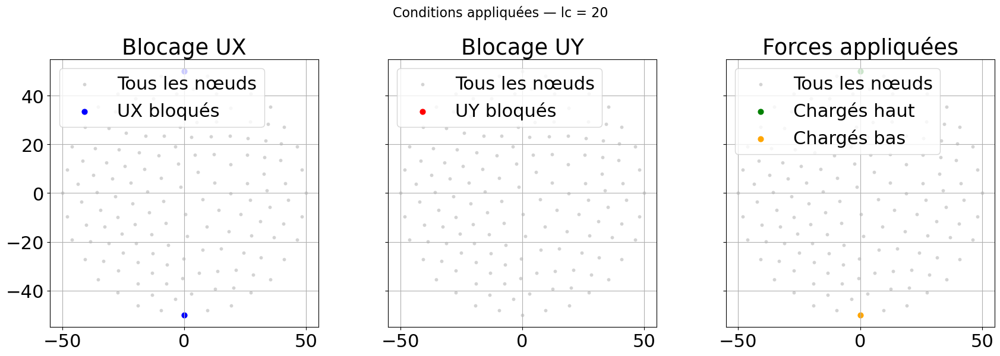

  → σ₁ centre (élément 14) : 0.062 N/mm²
  → Erreur relative : -2.3162 %

🔍 --- Vérification pour lc = 18 ---
  → Nombre de nœuds chargés (haut) : 1
  → Nombre de nœuds chargés (bas)  : 1
  → Force Y haut : [-100.]
  → Force Y bas  : [100.]
  → Somme totale Y : 0.0
  → DOF bloqués : 2
  → Blocages UX : [1 3]
  → Blocages UY : []


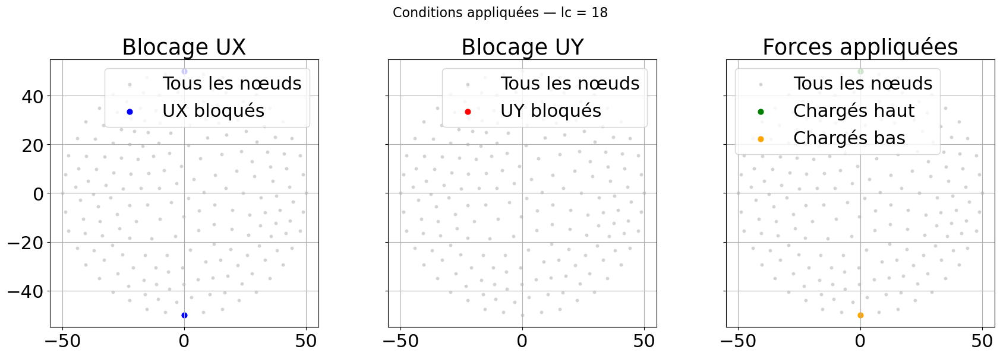

  → σ₁ centre (élément 33) : 0.063 N/mm²
  → Erreur relative : -1.1213 %

🔍 --- Vérification pour lc = 16 ---
  → Nombre de nœuds chargés (haut) : 1
  → Nombre de nœuds chargés (bas)  : 1
  → Force Y haut : [-100.]
  → Force Y bas  : [100.]
  → Somme totale Y : 0.0
  → DOF bloqués : 2
  → Blocages UX : [1 3]
  → Blocages UY : []


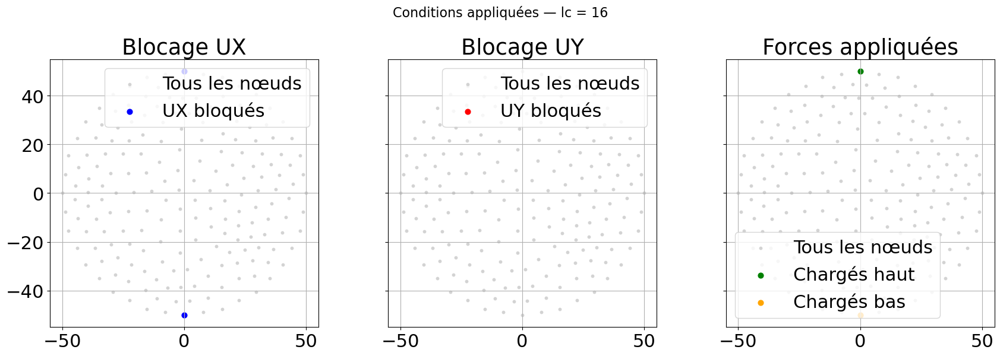

  → σ₁ centre (élément 33) : 0.063 N/mm²
  → Erreur relative : -1.4953 %

🔍 --- Vérification pour lc = 14 ---
  → Nombre de nœuds chargés (haut) : 1
  → Nombre de nœuds chargés (bas)  : 1
  → Force Y haut : [-100.]
  → Force Y bas  : [100.]
  → Somme totale Y : 0.0
  → DOF bloqués : 2
  → Blocages UX : [1 3]
  → Blocages UY : []


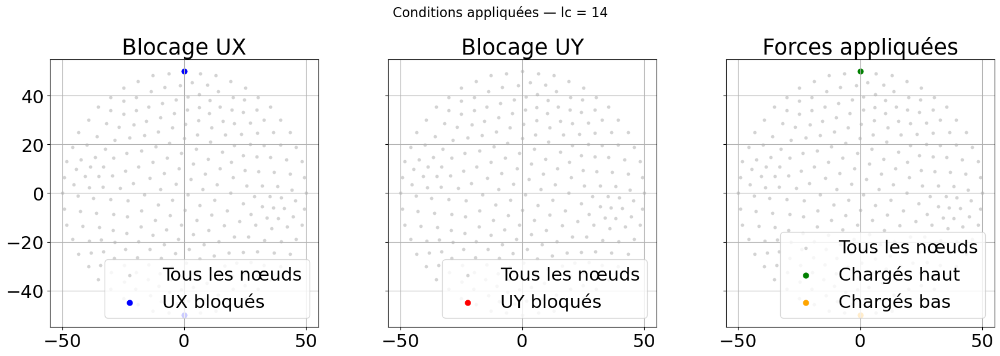

  → σ₁ centre (élément 41) : 0.063 N/mm²
  → Erreur relative : -1.3686 %

🔍 --- Vérification pour lc = 12 ---
  → Nombre de nœuds chargés (haut) : 1
  → Nombre de nœuds chargés (bas)  : 1
  → Force Y haut : [-100.]
  → Force Y bas  : [100.]
  → Somme totale Y : 0.0
  → DOF bloqués : 2
  → Blocages UX : [1 3]
  → Blocages UY : []


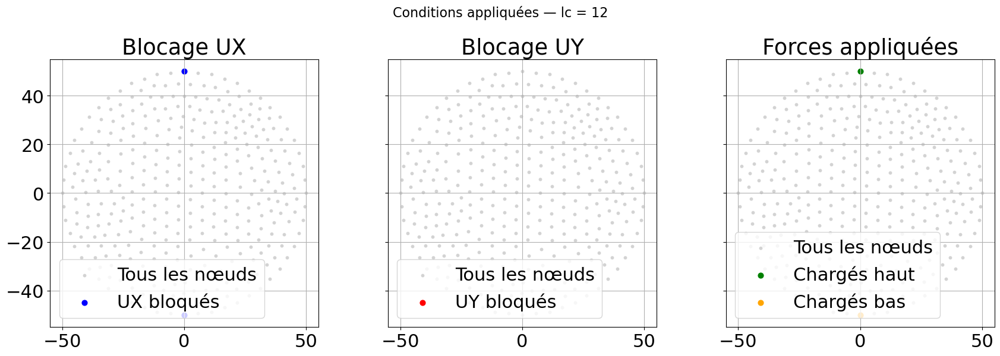

  → σ₁ centre (élément 69) : 0.062 N/mm²
  → Erreur relative : -3.0746 %
Convergence des erreurs relatives : ['-2.3162%', '-1.1213%', '-1.4953%', '-1.3686%', '-3.0746%']


In [19]:
Ftotale = 100  # exemple
erreur_list = []

for i, lc in enumerate(lc_values):
    suffix = str(lc).replace('.', '_')
    coords = coords_list[i]
    conn = conn_list[i]
    noeuds_haut = noeuds_haut_list[i]
    noeuds_bas = noeuds_bas_list[i]

    print(f"\n🔍 --- Vérification pour lc = {lc} ---")

    # Calcul de la force répartie
    F = calculerFcompression_simple(coords, noeuds_haut, noeuds_bas, Ftotale)
    F_repartie = F.reshape(-1, 2)

    # Blocages
    blocages = blocages_bresilien(coords)
    libres = np.logical_not(blocages)
    blocages_reshaped = blocages.reshape(-1, 2)

    # Infos
    print("  → Nombre de nœuds chargés (haut) :", len(noeuds_haut))
    print("  → Nombre de nœuds chargés (bas)  :", len(noeuds_bas))
    print("  → Force Y haut :", F_repartie[noeuds_haut, 1])
    print("  → Force Y bas  :", F_repartie[noeuds_bas, 1])
    print("  → Somme totale Y :", np.sum(F_repartie[:, 1]))

    bloques_ux = np.where(blocages_reshaped[:, 0])[0]
    bloques_uy = np.where(blocages_reshaped[:, 1])[0]
    print("  → DOF bloqués :", np.sum(~libres))
    print("  → Blocages UX :", bloques_ux)
    print("  → Blocages UY :", bloques_uy)

    # Recalcul des infos pour affichage
    blocages_reshaped = blocages.reshape(-1, 2)
    bloques_ux = np.where(blocages_reshaped[:, 0])[0]
    bloques_uy = np.where(blocages_reshaped[:, 1])[0]

    # Plot de vérification des conditions imposées
    fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharex=True, sharey=True)

    for ax in axes:
        ax.scatter(coords[:, 0], coords[:, 1], s=10, color='lightgray', label="Tous les nœuds")
        ax.set_aspect("equal")
        ax.grid(True)

    axes[0].scatter(coords[bloques_ux, 0], coords[bloques_ux, 1], s=40, color='blue', label="UX bloqués")
    axes[0].set_title("Blocage UX")
    axes[0].legend()

    axes[1].scatter(coords[bloques_uy, 0], coords[bloques_uy, 1], s=40, color='red', label="UY bloqués")
    axes[1].set_title("Blocage UY")
    axes[1].legend()

    axes[2].scatter(coords[noeuds_haut, 0], coords[noeuds_haut, 1], s=40, color='green', label="Chargés haut")
    axes[2].scatter(coords[noeuds_bas, 0], coords[noeuds_bas, 1], s=40, color='orange', label="Chargés bas")
    axes[2].set_title("Forces appliquées")
    axes[2].legend()

    plt.suptitle(f"Conditions appliquées — lc = {lc}", fontsize=16)
    plt.tight_layout()
    plt.show()

    # Résolution
    u = np.zeros(coords.shape[0] * 2)
    K = assemblerMatriceRigidite(conn, coords)
    u[libres] = np.linalg.solve(K[libres][:, libres], F[libres])
    contraintes = calculer_contraintes_elements(u, coords, conn)

    # Extraction σ₁ centre
    sigma1_centre, elem_central = sigma1_centre_disc(coords, conn, contraintes)
    print(f"  → σ₁ centre (élément {elem_central}) : {sigma1_centre:.3f} N/mm²")

    sigma_théorique = 2 / (np.pi * 10)  # disque e=10 mm
    erreur_relative = (sigma1_centre - sigma_théorique) / sigma_théorique * 100
    print(f"  → Erreur relative : {erreur_relative:.4f} %")
    erreur_list.append(erreur_relative)

print("Convergence des erreurs relatives :", [f"{e:.4f}%" for e in erreur_list])


=== Maillage 1 ===
ω (rad/s) : ['2564.5', '2590.9', '2910.6', '3433.4', '3506.9']
⚠️ Attention : champ vectoriel détecté, utilisation de la norme ||u||. Passez axis=0 ou axis=1 pour une composante spécifique.


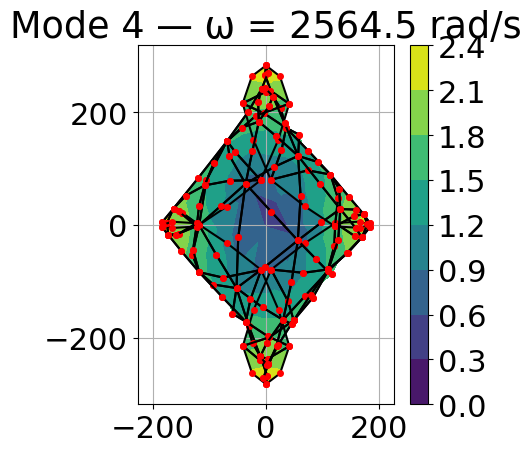

⚠️ Attention : champ vectoriel détecté, utilisation de la norme ||u||. Passez axis=0 ou axis=1 pour une composante spécifique.


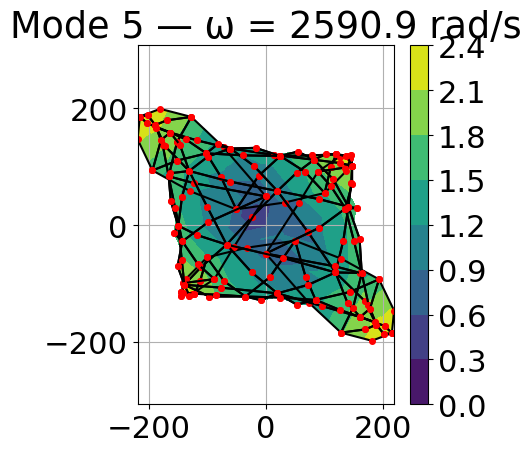

⚠️ Attention : champ vectoriel détecté, utilisation de la norme ||u||. Passez axis=0 ou axis=1 pour une composante spécifique.


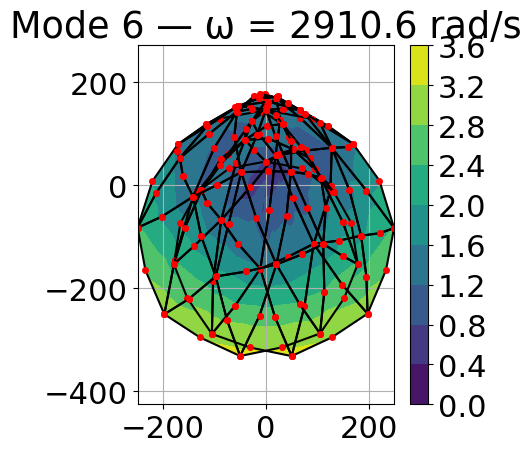

⚠️ Attention : champ vectoriel détecté, utilisation de la norme ||u||. Passez axis=0 ou axis=1 pour une composante spécifique.


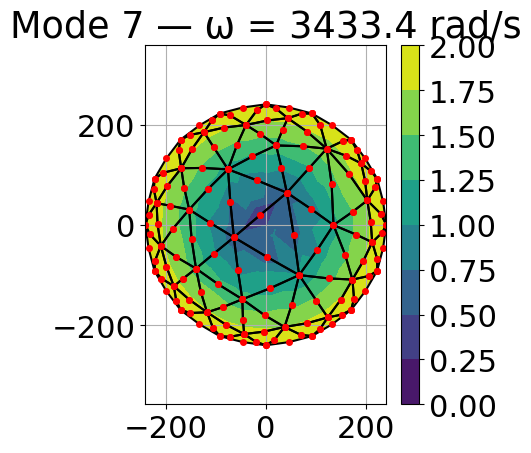

⚠️ Attention : champ vectoriel détecté, utilisation de la norme ||u||. Passez axis=0 ou axis=1 pour une composante spécifique.


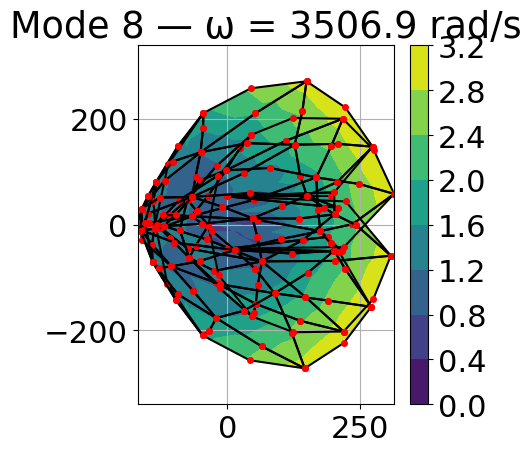


=== Maillage 2 ===
ω (rad/s) : ['2552.3', '2580.0', '2896.5', '3417.3', '3479.2']
⚠️ Attention : champ vectoriel détecté, utilisation de la norme ||u||. Passez axis=0 ou axis=1 pour une composante spécifique.


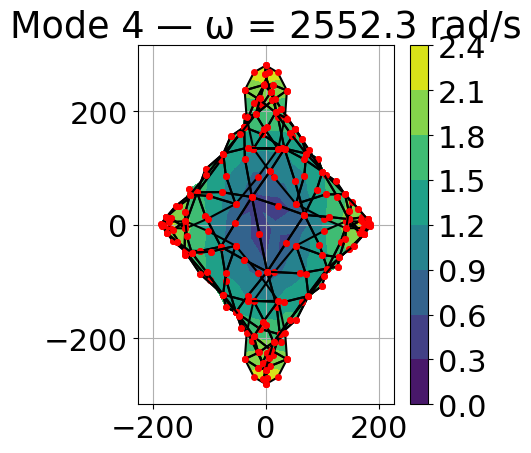

⚠️ Attention : champ vectoriel détecté, utilisation de la norme ||u||. Passez axis=0 ou axis=1 pour une composante spécifique.


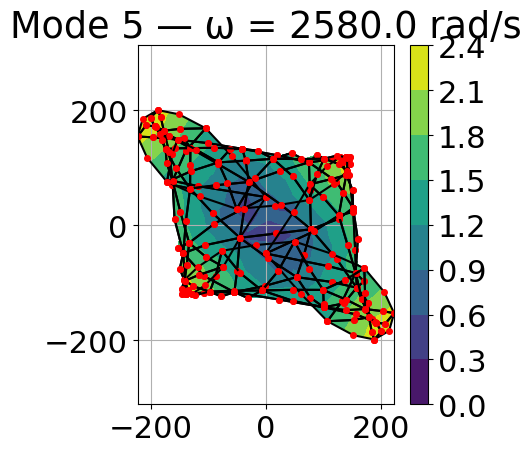

⚠️ Attention : champ vectoriel détecté, utilisation de la norme ||u||. Passez axis=0 ou axis=1 pour une composante spécifique.


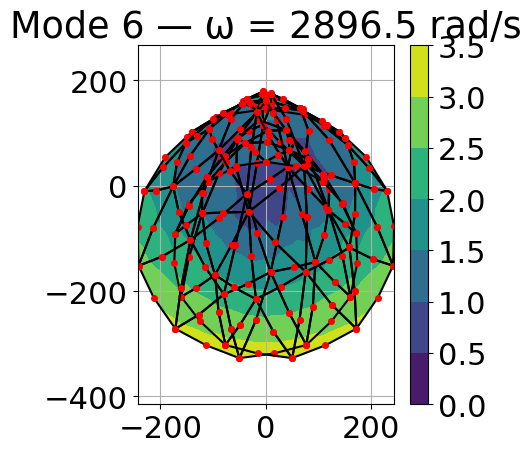

⚠️ Attention : champ vectoriel détecté, utilisation de la norme ||u||. Passez axis=0 ou axis=1 pour une composante spécifique.


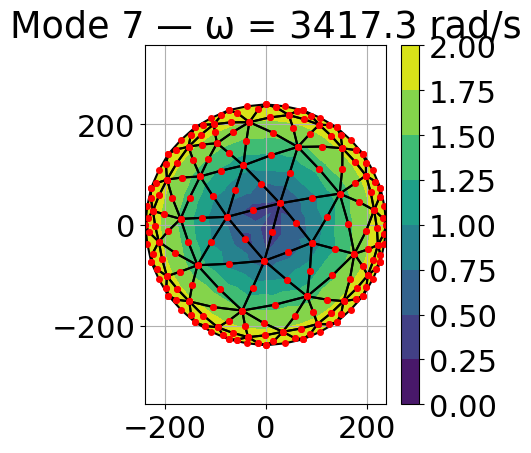

⚠️ Attention : champ vectoriel détecté, utilisation de la norme ||u||. Passez axis=0 ou axis=1 pour une composante spécifique.


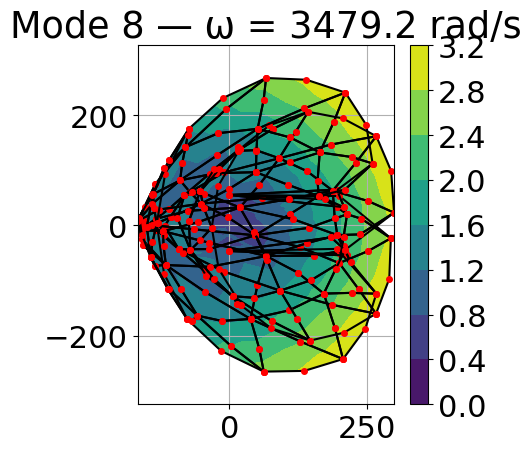


=== Maillage 3 ===
ω (rad/s) : ['2552.3', '2578.5', '2896.4', '3417.3', '3448.5']
⚠️ Attention : champ vectoriel détecté, utilisation de la norme ||u||. Passez axis=0 ou axis=1 pour une composante spécifique.


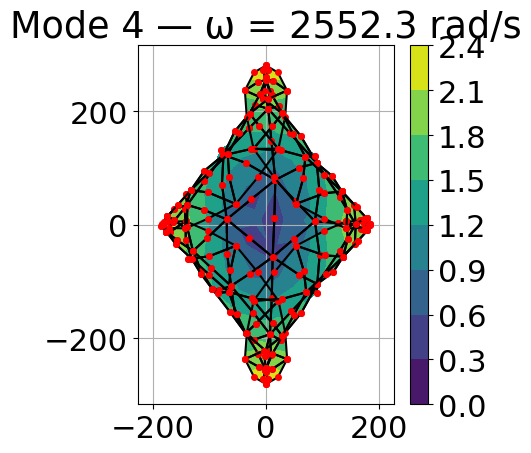

⚠️ Attention : champ vectoriel détecté, utilisation de la norme ||u||. Passez axis=0 ou axis=1 pour une composante spécifique.


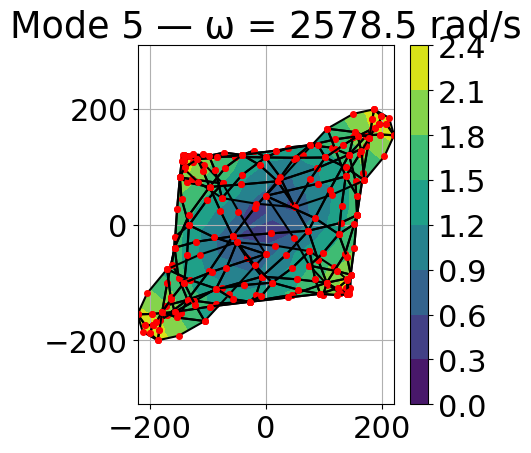

⚠️ Attention : champ vectoriel détecté, utilisation de la norme ||u||. Passez axis=0 ou axis=1 pour une composante spécifique.


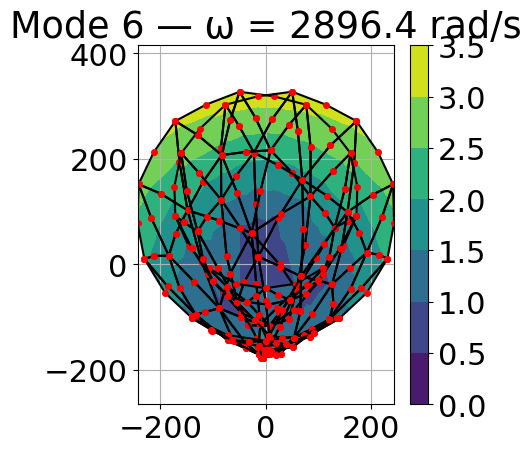

⚠️ Attention : champ vectoriel détecté, utilisation de la norme ||u||. Passez axis=0 ou axis=1 pour une composante spécifique.


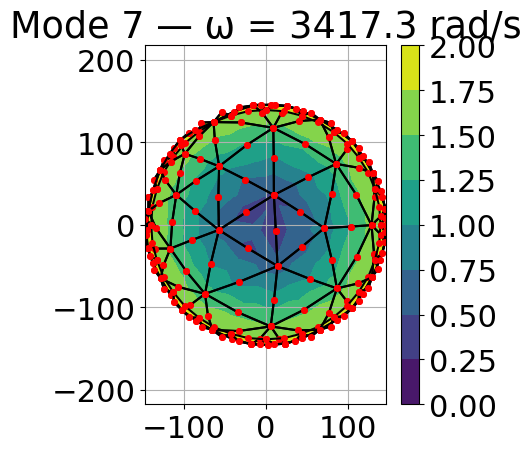

⚠️ Attention : champ vectoriel détecté, utilisation de la norme ||u||. Passez axis=0 ou axis=1 pour une composante spécifique.


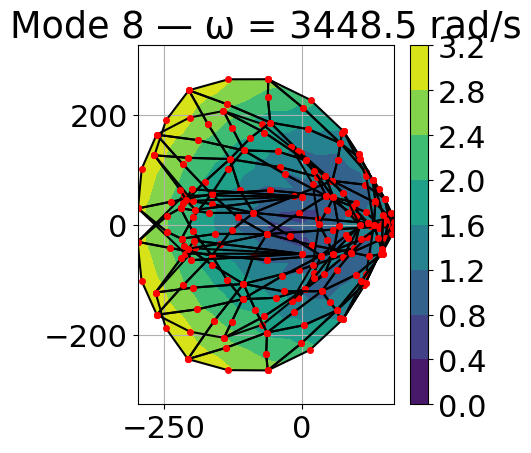


=== Maillage 4 ===
ω (rad/s) : ['2545.6', '2572.5', '2888.8', '3408.6', '3435.8']
⚠️ Attention : champ vectoriel détecté, utilisation de la norme ||u||. Passez axis=0 ou axis=1 pour une composante spécifique.


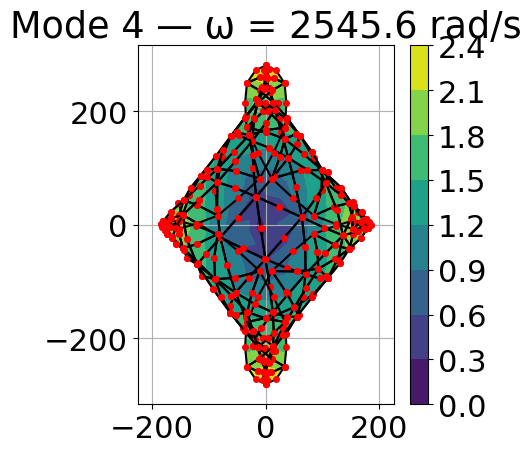

⚠️ Attention : champ vectoriel détecté, utilisation de la norme ||u||. Passez axis=0 ou axis=1 pour une composante spécifique.


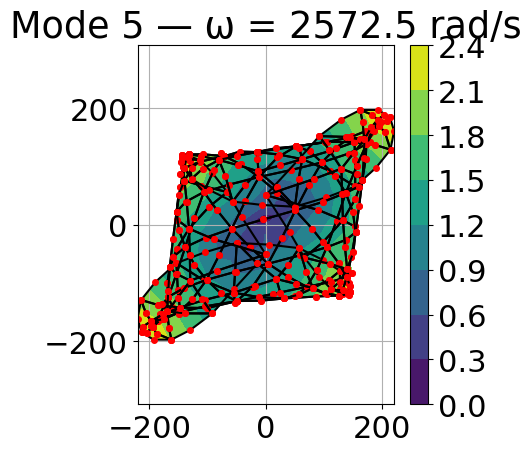

⚠️ Attention : champ vectoriel détecté, utilisation de la norme ||u||. Passez axis=0 ou axis=1 pour une composante spécifique.


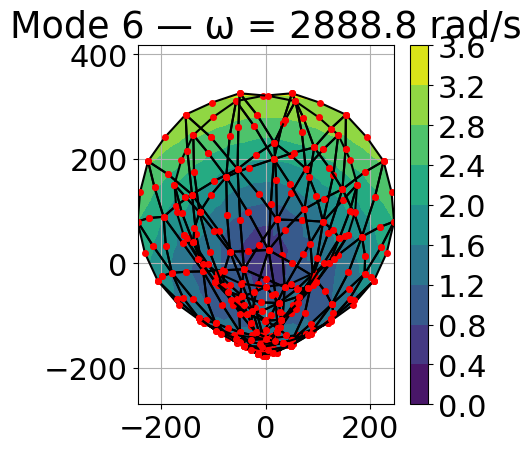

⚠️ Attention : champ vectoriel détecté, utilisation de la norme ||u||. Passez axis=0 ou axis=1 pour une composante spécifique.


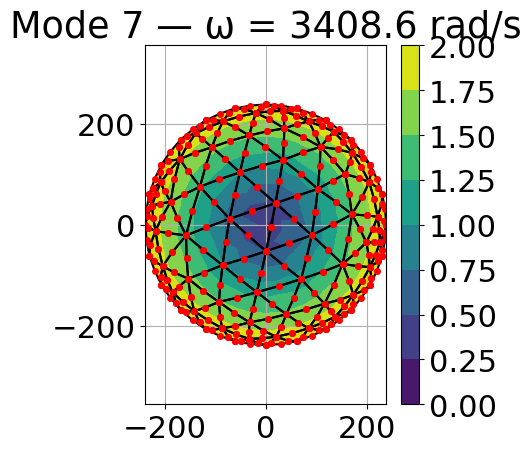

⚠️ Attention : champ vectoriel détecté, utilisation de la norme ||u||. Passez axis=0 ou axis=1 pour une composante spécifique.


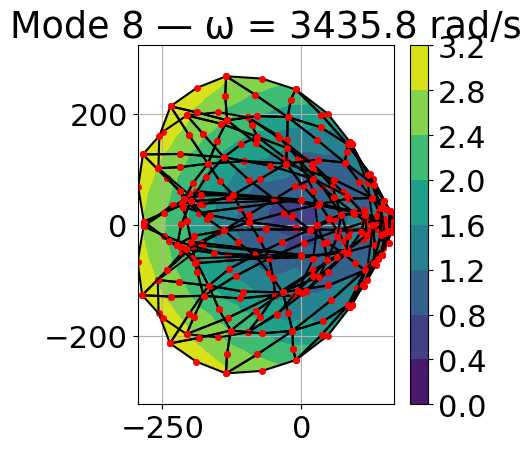


=== Maillage 5 ===
ω (rad/s) : ['2541.7', '2568.6', '2884.2', '3403.4', '3420.1']
⚠️ Attention : champ vectoriel détecté, utilisation de la norme ||u||. Passez axis=0 ou axis=1 pour une composante spécifique.


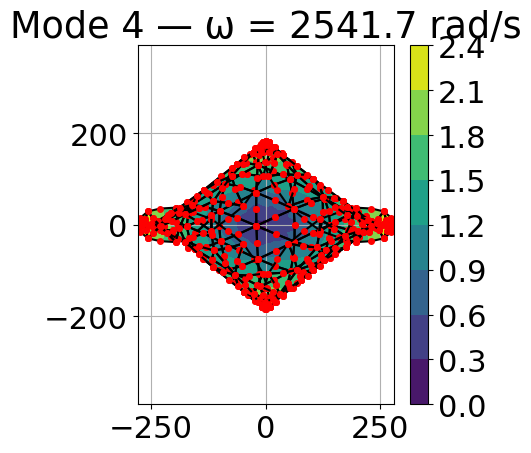

⚠️ Attention : champ vectoriel détecté, utilisation de la norme ||u||. Passez axis=0 ou axis=1 pour une composante spécifique.


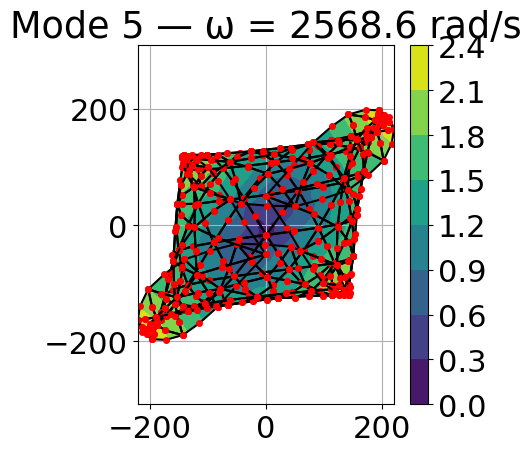

⚠️ Attention : champ vectoriel détecté, utilisation de la norme ||u||. Passez axis=0 ou axis=1 pour une composante spécifique.


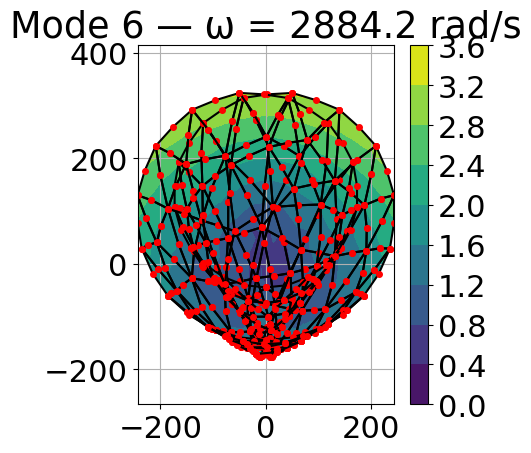

⚠️ Attention : champ vectoriel détecté, utilisation de la norme ||u||. Passez axis=0 ou axis=1 pour une composante spécifique.


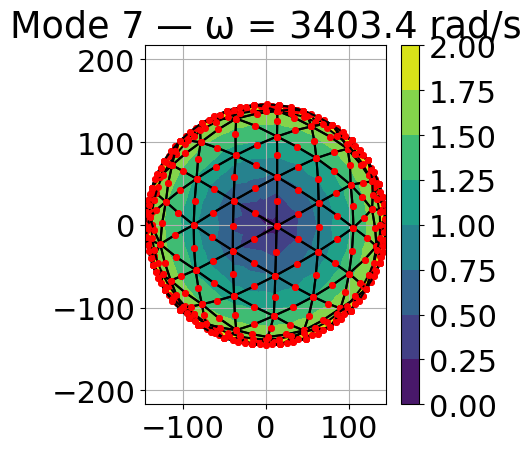

⚠️ Attention : champ vectoriel détecté, utilisation de la norme ||u||. Passez axis=0 ou axis=1 pour une composante spécifique.


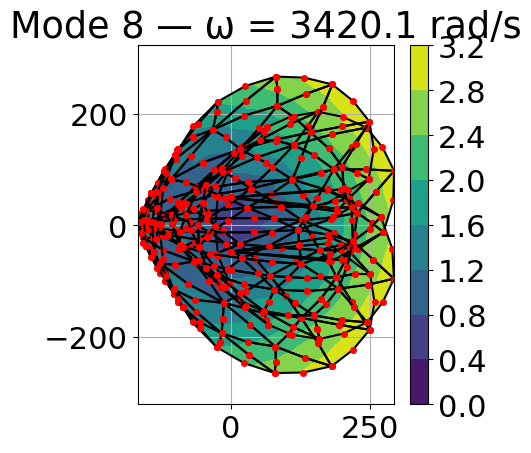

In [20]:
def calculerMatriceMasseLocale(connectivite_element, coordonnees):
    rho = 2.4e-6
    t_epaisseur = 10.0

    quads = [
    (1/3, 1/3),
    (0.0597159, 0.4701421),
    (0.4701421, 0.0597159),
    (0.4701421, 0.4701421),
    (0.1012865, 0.7974269),
    (0.7974269, 0.1012865),
    (0.1012865, 0.1012865),
    ]
    weights = [0.225,
               0.1323942, 0.1323942, 0.1323942,
               0.1259392, 0.1259392, 0.1259392]


    noeuds = coordonnees[connectivite_element.ravel(), :]  # (6,2)
    M_local = np.zeros((12, 12))  # 6 nœuds × 2 DoF

    for (s, t), w in zip(quads, weights):
        r = 1 - s - t

        N1 = r * (2 * r - 1)
        N2 = s * (2 * s - 1)
        N3 = t * (2 * t - 1)
        N4 = 4 * r * s
        N5 = 4 * s * t
        N6 = 4 * t * r

        N = np.array([[N1, 0, N2, 0, N3, 0, N4, 0, N5, 0, N6, 0],
                      [0, N1, 0, N2, 0, N3, 0, N4, 0, N5, 0, N6]])

        B = calculerB_T6(noeuds, s, t)
        J_full = np.linalg.inv(Mat_J_T6(noeuds, s, t))
        J = J_full[0:2, 0:2]
        detJ = np.linalg.det(J)

        M_local += w * rho * N.T @ N * detJ

    return t_epaisseur * M_local


def assemblerMatriceMasse(connectivite, coordonnees):
    n_elem = connectivite.shape[0]
    n_nodes = coordonnees.shape[0]
    numEq = calculerNumerosEquations(connectivite)
    M = np.zeros((n_nodes * 2, n_nodes * 2))
    for e in range(n_elem):
        ddl = numEq[e, :]
        connectivite_element = connectivite[e, :]
        M_locale = calculerMatriceMasseLocale(connectivite_element, coordonnees)
        for i, gi in enumerate(ddl):
            for j, gj in enumerate(ddl):
                M[gi, gj] += M_locale[i, j]
    return M

# --- TRAITEMENT MODAL T6 ---
amplification = 100

for idx, (coords, conn) in enumerate(zip(coords_list, conn_list)):
    M = assemblerMatriceMasse(conn, coords)
    K = assemblerMatriceRigidite(conn, coords)
    n_nodes = coords.shape[0]
    blocages = blocages_bresilien(coords)
    libres = np.logical_not(blocages)

    M_reduit = M[libres, :][:, libres]
    K_reduit = K[libres, :][:, libres]

    K_dense = K_reduit.toarray() if hasattr(K_reduit, "toarray") else K_reduit
    M_dense = M_reduit.toarray() if hasattr(M_reduit, "toarray") else M_reduit

    eig_vals, eig_vects = eigh(K_dense, M_dense)
    eig_vals = eig_vals.real
    eig_vects = eig_vects.real

    sorted_modes = np.argsort(eig_vals)
    eig_vals = eig_vals[sorted_modes]
    eig_vects = eig_vects[:, sorted_modes]

    omegas = [np.sqrt(eig_vals[i + 3]) for i in range(5)]

    print(f"\n=== Maillage {idx + 1} ===")
    print(f"ω (rad/s) : {[f'{w:.1f}' for w in omegas]}")

    u = np.zeros(2 * n_nodes)
    for mode_id in range(5):
        omega = omegas[mode_id]
        vecteur_propre = eig_vects[:, mode_id + 3]
        u[:] = 0
        u[libres] = vecteur_propre
        u_disp = coords + amplification * u.reshape(n_nodes, 2)

        plt.figure(figsize=(5, 5))
        plotT6Mesh(u_disp, conn, u)
        plt.title(f"Mode {mode_id + 4} — ω = {omega:.1f} rad/s")
        plt.axis("equal")
        plt.grid(True)
        plt.tight_layout()
        plt.show()


--- Résultat pour lc = 20 mm ---
Norme de K : 2.05e+07
Max coordonnée : 50.00 mm
💥 Rupture détectée à F ≈ 4663.35 N (σ₁ centre ≈ 2.90 ≥ 2.90)
Erreur relative : 2.3718 %


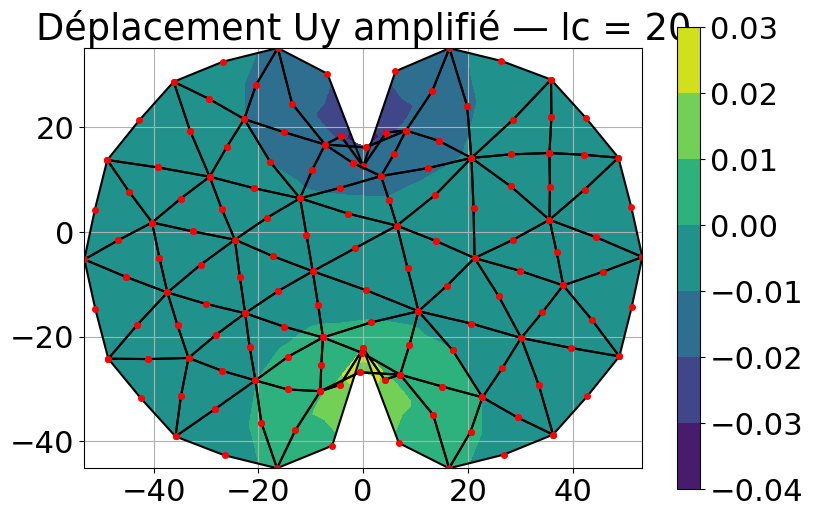

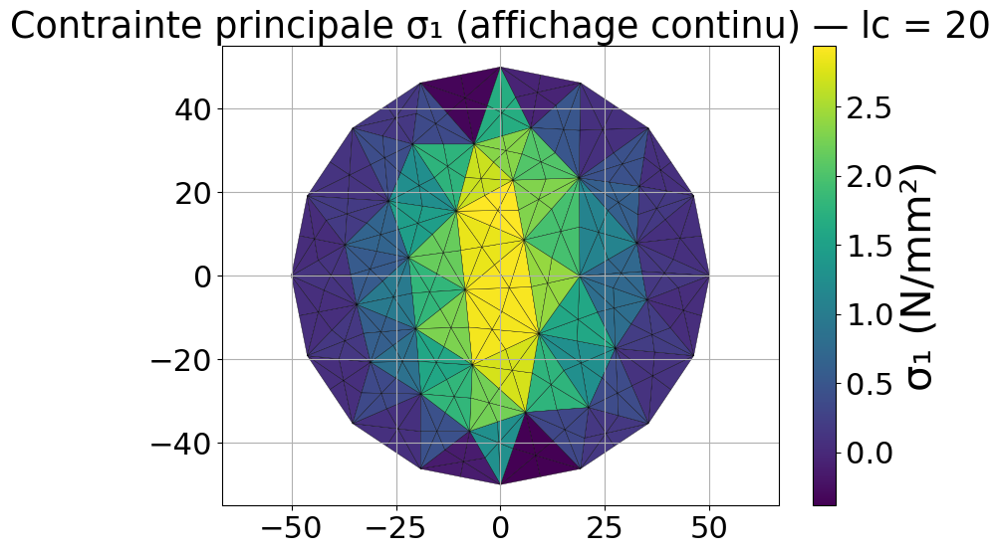


--- Résultat pour lc = 18 mm ---
Norme de K : 2.34e+07
Max coordonnée : 50.00 mm
💥 Rupture détectée à F ≈ 4606.99 N (σ₁ centre ≈ 2.90 ≥ 2.90)
Erreur relative : 1.1346 %


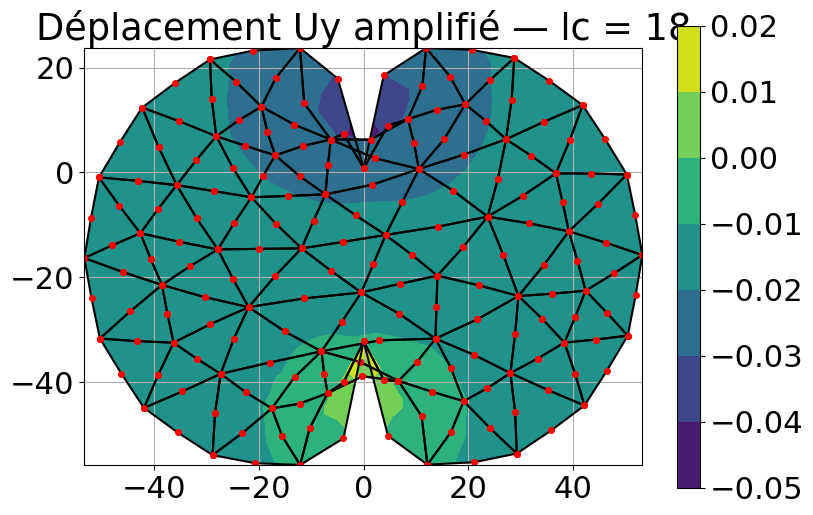

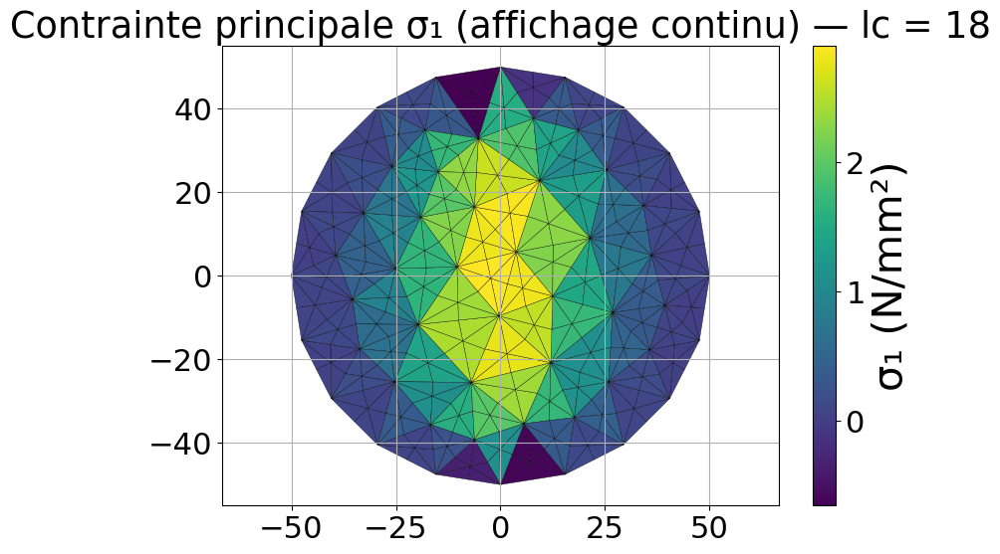


--- Résultat pour lc = 16 mm ---
Norme de K : 2.34e+07
Max coordonnée : 50.00 mm
💥 Rupture détectée à F ≈ 4624.46 N (σ₁ centre ≈ 2.90 ≥ 2.90)
Erreur relative : 1.5180 %


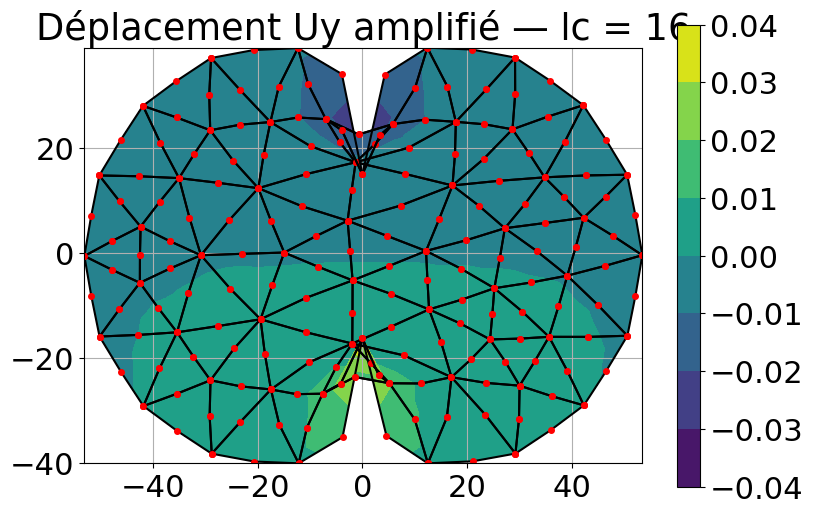

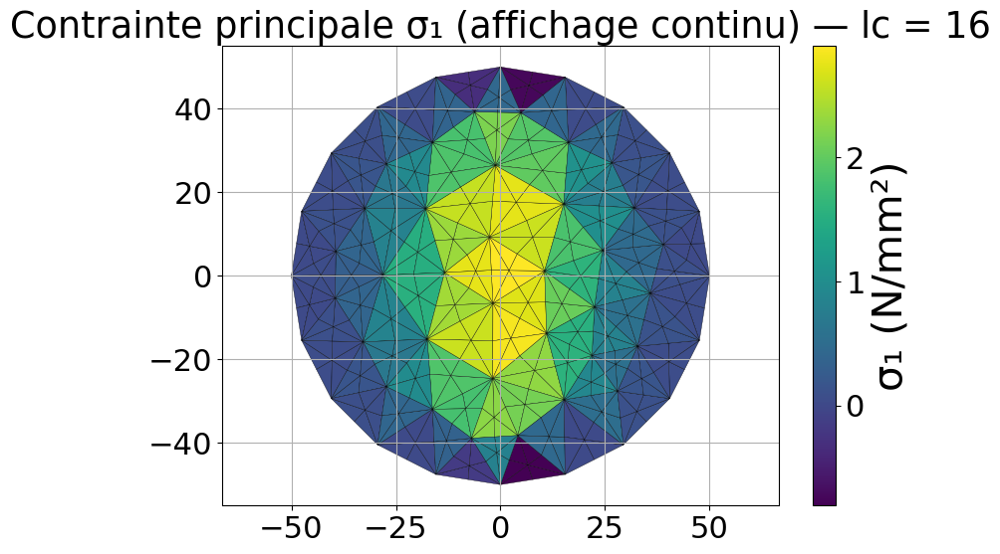


--- Résultat pour lc = 14 mm ---
Norme de K : 2.76e+07
Max coordonnée : 50.00 mm
💥 Rupture détectée à F ≈ 4618.53 N (σ₁ centre ≈ 2.90 ≥ 2.90)
Erreur relative : 1.3878 %


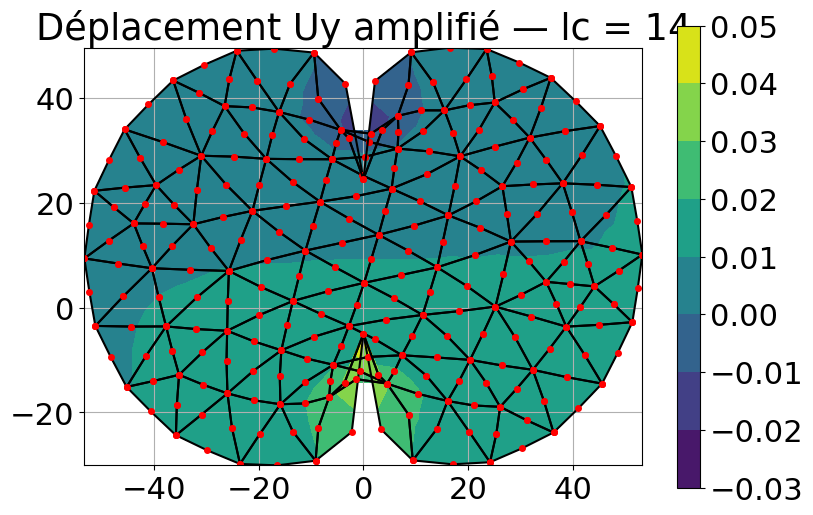

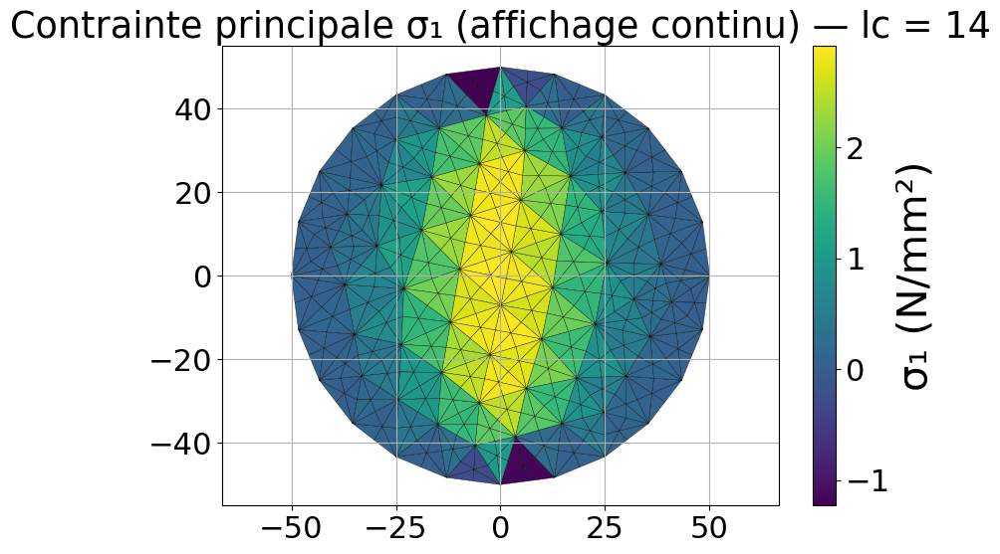


--- Résultat pour lc = 12 mm ---
Norme de K : 3.15e+07
Max coordonnée : 50.00 mm
💥 Rupture détectée à F ≈ 4699.87 N (σ₁ centre ≈ 2.90 ≥ 2.90)
Erreur relative : 3.1735 %


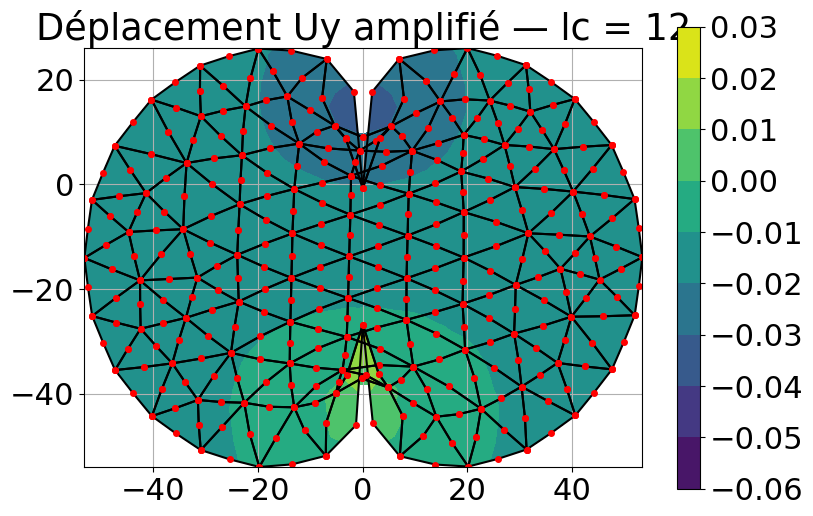

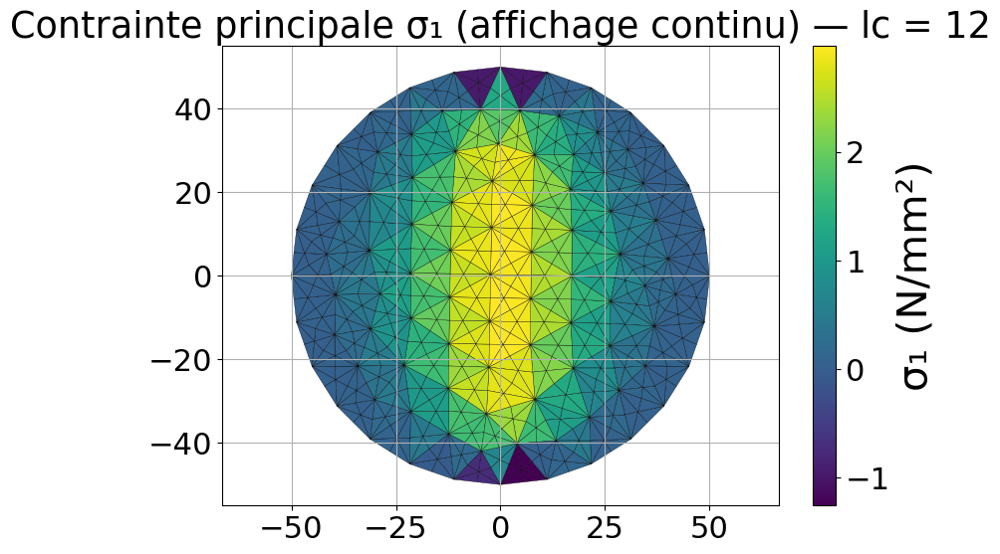

Convergence des erreurs relatives : ['2.3718%', '1.1346%', '1.5180%', '1.3878%', '3.1735%']


In [21]:
import matplotlib.tri as tri

def triangulation_aux_T6(coords, conn, sigma1_elements):
    """
    Découpe chaque triangle T6 en 6 triangles T3 pour affichage continu.
    Retourne :
    - les nouveaux points (coords étendus avec les centroïdes)
    - la connectivité T3
    - les champs interpolés σ₁ sur ces triangles
    """
    new_coords = coords.tolist()
    triangles = []
    sigma1_extended = []

    for i, tri6 in enumerate(conn):
        n0, n1, n2, m0, m1, m2 = tri6
        pts = coords[[n0, n1, n2]]
        centroid = pts.mean(axis=0)

        # Ajoute le centroïde
        idx_centre = len(new_coords)
        new_coords.append(centroid)

        # Crée 6 triangles autour du centroïde
        triangles += [
            [n0, m0, idx_centre],
            [m0, n1, idx_centre],
            [n1, m1, idx_centre],
            [m1, n2, idx_centre],
            [n2, m2, idx_centre],
            [m2, n0, idx_centre],
        ]

        # Réplique la valeur de σ₁ sur les 6 sous-triangles
        sigma1_extended += [sigma1_elements[i]] * 6

    return np.array(new_coords), np.array(triangles), np.array(sigma1_extended)

erreur_list = []
# --- Boucle principale ---
for i, lc in enumerate(lc_values):
    suffix = str(lc).replace(".", "_")
    coords = coords_list[i]
    conn = conn_list[i]
    noeuds_haut = noeuds_haut_list[i]
    noeuds_bas = noeuds_bas_list[i]

    print(f"\n--- Résultat pour lc = {lc} mm ---")

    K = assemblerMatriceRigidite(conn, coords)
    blocages = blocages_bresilien(coords)

    F_rupture, sigma1_centre, u = detecter_force_de_rupture_automatique(
        K, coords, conn, blocages,
        noeuds_haut, noeuds_bas,
        sigma_t=2.9, Fmin=4530, Fmax=4800, tol=0.1
    )

    u_disp = u.reshape(-1, 2)
    contraintes = calculer_contraintes_elements(u, coords, conn)
    contraintes_princ = np.array([contraintes_principales(sigma) for sigma in contraintes])
    sigma1_elements = contraintes_princ[:, 0]

    valeur_theorique = 2.9 * np.pi * 100 * 10 / 2
    erreur_rel = (F_rupture - valeur_theorique) / valeur_theorique * 100
    print(f"Erreur relative : {erreur_rel:.4f} %")
    erreur_list.append(erreur_rel)
    
    # --- Plot 1 : déplacement amplifié ---
    amplification = 1e3
    plt.figure()
    plotT6Mesh(coords + amplification * u_disp, conn, nodal_field=u_disp, axis=1)
    plt.title(f"Déplacement Uy amplifié — lc = {lc}")
    plt.show()

    # --- Plot 2 : contrainte σ₁ en champ continu ---
    coords_extended, conn_tri, sigma1_tri = triangulation_aux_T6(coords, conn, sigma1_elements)

    triang = tri.Triangulation(coords_extended[:, 0], coords_extended[:, 1], conn_tri)

    plt.figure()
    plt.tripcolor(triang, facecolors=sigma1_tri, edgecolors='k', cmap='viridis')
    plt.colorbar(label="σ₁ (N/mm²)")
    plt.title(f"Contrainte principale σ₁ (affichage continu) — lc = {lc}")
    plt.axis("equal")
    plt.grid(True)
    plt.show()

print("Convergence des erreurs relatives :", [f"{e:.4f}%" for e in erreur_list])